# Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from matplotlib.colors import LogNorm, Normalize
import matplotlib.patheffects as pe
import torch
from torch import nn
from torchvision import models
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.metrics import confusion_matrix, roc_curve, auc, brier_score_loss
from sklearn.calibration import calibration_curve
import glob
from astropy.visualization import simple_norm
import os
from tqdm import tqdm
import pandas as pd
from scipy.stats import binned_statistic
from photutils.segmentation import detect_threshold, detect_sources
from skimage.transform import resize
import umap.umap_ as umap # Recommended way to import UMAP
from matplotlib.colors import LinearSegmentedColormap
from torchvision.models.feature_extraction import create_feature_extractor, get_graph_node_names
from SetRandomSeed import set_random_seeds, GeneratorSeed
from zoobot.pytorch.training.finetune import FinetuneableZoobotClassifier

/n/home09/aschechter/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/n/home09/aschechter/.local/lib/python3.10/site-packages/lightning/fabric/__init__.py:41: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


In [2]:
print(np.load('/n/holystore01/LABS/hernquist_lab/Users/aschechter/NormalizedDataset/test/anymergers/mergerlabel.npy'))

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [3]:
pd.set_option('display.max_columns', 40)
set_random_seeds(626)
g = GeneratorSeed(626)

In [4]:
# Set the figure size to match one column in AASTeX (3.25 inches width)
width = 3.25
height = 2.5 # height can vary, 2.5 inches is just a suggestion
matplotlib.rcParams["font.size"] = "10"


# Training Curves

In [5]:
trainingloss = pd.read_pickle('nano_1_trial1_3.154957151204336e-07_loss') 
trainingacc  = pd.read_pickle('nano_1_trial1_3.154957151204336e-07_acc') 

In [6]:
cmap = matplotlib.colormaps['magma']

color1 = cmap(0.2)
color2 = cmap(0.3)
color3 = cmap(0.4)
color4 = cmap(0.5)
color5 = cmap(0.6)
color6 = cmap(0.7)

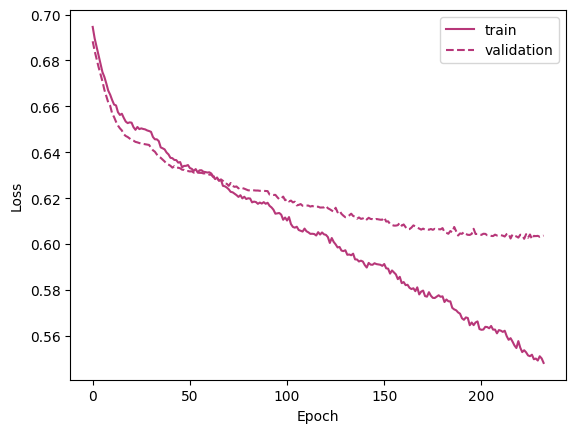

In [7]:
plt.figure()
plt.plot(np.arange(0,len(trainingloss['train'])), trainingloss['train'], color = color4, label = 'train')
plt.plot(np.arange(0,len(trainingloss['validation'])), trainingloss['validation'], linestyle = '--', color = color4, label = 'validation')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


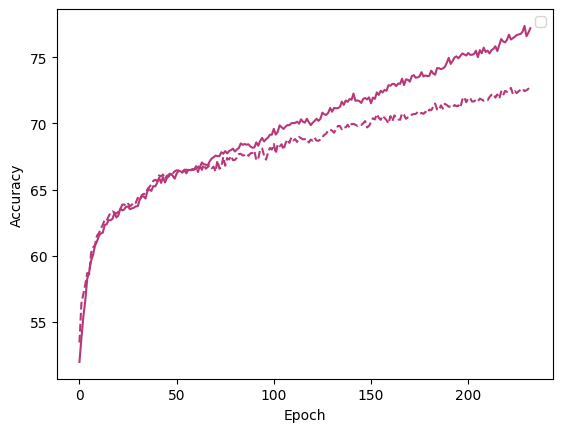

In [8]:
plt.figure()
plt.plot(np.arange(0,len(trainingacc['train'])), trainingacc['train'], color = color4)
plt.plot(np.arange(0,len(trainingacc['validation'])), trainingacc['validation'], linestyle = '--', color = color4)
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

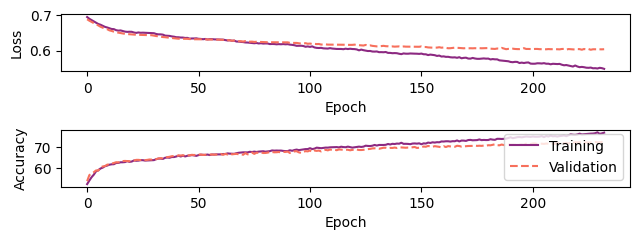

In [9]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize = (2*width, height))
ax1.plot(np.arange(0,len(trainingloss['train'])), trainingloss['train'], color = color3, label = 'Training')
ax1.plot(np.arange(0,len(trainingloss['validation'])), trainingloss['validation'], linestyle = '--', color = color6, label = 'Validation')

ax1.set_ylabel('Loss')
ax1.set_xlabel('Epoch')
#ax1.legend()

ax2.plot(np.arange(0,len(trainingacc['train'])), trainingacc['train'], color = color3, label = 'Training')
ax2.plot(np.arange(0,len(trainingacc['validation'])), trainingacc['validation'], linestyle = '--', color = color6, label = 'Validation')

ax2.set_ylabel('Accuracy')
ax2.set_xlabel('Epoch')
ax2.legend(loc = 4)

plt.tight_layout()
plt.savefig('trainingmetrics.png', dpi = 300)
plt.show()

# Read In Network

In [10]:

#Set up the model for inference

learning_rate=3.154957151204336e-07 #2.691630523637843e-06
lr_decay=0.9507084029946233
weight_decay=0.1 #1.921868518352624e-05 #0.01
dropout=0.5857621119556218
hidden_size=256
batch_size=256
BATCH_SIZE = 256
test_batch_size = 16
num_classes = 2

CNNName =  'nano_1_trial1_lr' + 'lr' + str(learning_rate)

model = FinetuneableZoobotClassifier(name='hf_hub:mwalmsley/zoobot-encoder-convnext_nano', learning_rate=learning_rate,  # use a low learning rate
    layer_decay=lr_decay,  # reduce the learning rate from lr to lr^0.5 for each block deeper in the network
    # arguments specific to FinetuneableZoobotClassifier
    num_classes=2
)
model.head = nn.Sequential(
        nn.Dropout(dropout),
        nn.Linear(640, hidden_size), 
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(hidden_size, num_classes)
    )
  
  
  
checkpoint = torch.load('nano_1_trial1_lr3.154957151204336e-07_epoch120.pth', map_location=torch.device('cpu'))

# Load the model weights from the checkpoint
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to('cpu')  # Ensure the model is on the correct device (GPU/CPU)
model.eval()  # Switch to evaluation mode

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [11]:
print("Original head:", model.head)

Original head: Sequential(
  (0): Dropout(p=0.5857621119556218, inplace=False)
  (1): Linear(in_features=640, out_features=256, bias=True)
  (2): ReLU()
  (3): Dropout(p=0.5857621119556218, inplace=False)
  (4): Linear(in_features=256, out_features=2, bias=True)
)


In [12]:
print(model)

FinetuneableZoobotClassifier(
  (encoder): ConvNeXt(
    (stem): Sequential(
      (0): Conv2d(3, 80, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((80,), eps=1e-06, elementwise_affine=True)
    )
    (stages): Sequential(
      (0): ConvNeXtStage(
        (downsample): Identity()
        (blocks): Sequential(
          (0): ConvNeXtBlock(
            (conv_dw): Conv2d(80, 80, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=80)
            (norm): LayerNorm2d((80,), eps=1e-06, elementwise_affine=True)
            (mlp): Mlp(
              (fc1): Conv2d(80, 320, kernel_size=(1, 1), stride=(1, 1))
              (act): GELU()
              (drop1): Dropout(p=0.0, inplace=False)
              (norm): Identity()
              (fc2): Conv2d(320, 80, kernel_size=(1, 1), stride=(1, 1))
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (shortcut): Identity()
            (drop_path): Identity()
          )
          (1): ConvNeXtBlock(
         

In [13]:
from BinaryMergerDataset import BinaryMergerDataset, get_transforms
path = '/n/holystore01/LABS/hernquist_lab/Users/aschechter/NormalizedDataset/'
BATCH_SIZE = 256

cpu


In [14]:
test_mergers_dataset_orig = BinaryMergerDataset(path, 'test', mergers = True, transform = get_transforms(aug=False), codetest=False)
test_nonmergers_dataset_orig = BinaryMergerDataset(path, 'test', mergers = False, transform = get_transforms(aug=False), codetest=False)


test_dataset_full = torch.utils.data.ConcatDataset([test_mergers_dataset_orig, test_nonmergers_dataset_orig])
# Create a fixed permutation
indices = np.random.permutation(len(test_dataset_full))
shuffled_test_dataset = Subset(test_dataset_full, indices)

#test_dataloader = DataLoader(test_dataset_full, shuffle = False, num_workers = 0, batch_size=BATCH_SIZE)#num workers used to be 4
test_dataloader = DataLoader(shuffled_test_dataset, shuffle = False, num_workers = 0, batch_size=test_batch_size, generator=g)#num workers used to be 4

train_mergers_dataset_augment = BinaryMergerDataset(path, 'train', mergers = True, transform = get_transforms(aug=True), codetest=False)
train_nonmergers_dataset_augment = BinaryMergerDataset(path, 'train', mergers = False, transform = get_transforms(aug=True), codetest=False)

train_mergers_dataset_orig = BinaryMergerDataset(path, 'train', mergers = True, transform = get_transforms(aug=False), codetest=False)
train_nonmergers_dataset_orig = BinaryMergerDataset(path, 'train', mergers = False, transform = get_transforms(aug=False), codetest=False)

train_dataset_full = torch.utils.data.ConcatDataset([train_mergers_dataset_augment, train_nonmergers_dataset_augment, train_mergers_dataset_orig, train_nonmergers_dataset_orig])
train_dataloader = DataLoader(train_dataset_full, shuffle = True, num_workers = 0, batch_size=BATCH_SIZE, generator=g)

validation_mergers_dataset_orig = BinaryMergerDataset(path, 'validation', mergers = True, transform = get_transforms(aug=False), codetest=False)
validation_nonmergers_dataset_orig = BinaryMergerDataset(path, 'validation', mergers = False, transform = get_transforms(aug=False), codetest=False)

validation_dataset_full = torch.utils.data.ConcatDataset([validation_mergers_dataset_orig, validation_nonmergers_dataset_orig])
validation_dataloader = DataLoader(validation_dataset_full, shuffle = False, num_workers = 0, batch_size=BATCH_SIZE, generator=g)#num workers used to be 4



In [15]:
print(len(train_mergers_dataset_orig) + len(train_mergers_dataset_augment))
print(len(train_nonmergers_dataset_orig) + len(train_nonmergers_dataset_augment))

print(len(validation_mergers_dataset_orig))
print(len(validation_nonmergers_dataset_orig))

print(len(test_mergers_dataset_orig))
print(len(test_nonmergers_dataset_orig))

5904
5910
1170
1110
624
630


In [16]:
def get_accuracy(pred,original):
    print(pred, original)
    return np.mean(pred == original) * 100

def plot_confusion_matrix(cm, classes, epoch, cm_raw=None): #help from chat GPT
    plt.figure(figsize=(3.5,3.5))
    if cm_raw is not None:
        labels = np.array([[f"{cm[i,j]:.2f}%\n({cm_raw[i,j]})" for j in range(cm.shape[1])] for i in range(cm.shape[0])])
        sns.heatmap(cm, annot=labels, fmt="", cmap='Purples', xticklabels=classes, yticklabels=classes, vmin = 0, vmax = 100,
                    square = True, cbar_kws={'label': 'Percentage', "shrink": 0.65})
    else:
        sns.heatmap(cm, annot=True, fmt=".2f", cmap='Purples', xticklabels=classes, yticklabels=classes, vmin = 0, vmax = 100,
                    square = True, cbar_kws={'label': 'Percentage', "shrink": 0.65})
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    #plt.title('Confusion Matrix ' + str(epoch) + ' Set')
    plt.tight_layout()
    plt.savefig('ConfusionMatrix_TestSet_' + CNNName +'.png', dpi = 300, bbox_inches="tight")
    plt.show()

In [17]:
print(get_graph_node_names(model))
feature_extractor_model = create_feature_extractor(model, return_nodes={'head.4': 'extracted_features',})
feature_extractor_model.eval()
feature_extractor_model.to(device)

encoder_extractor_model = create_feature_extractor(model, return_nodes={'encoder': 'encoder_features'})
encoder_extractor_model.eval()
encoder_extractor_model.to(device)

(['x', 'encoder.stem.0', 'encoder.stem.1.permute', 'encoder.stem.1.encoder_stem_1_weight', 'encoder.stem.1.encoder_stem_1_bias', 'encoder.stem.1.layer_norm', 'encoder.stem.1.permute_1', 'encoder.stages.0.downsample', 'encoder.stages.0.blocks.0.conv_dw', 'encoder.stages.0.blocks.0.norm.permute', 'encoder.stages.0.blocks.0.norm.encoder_stages_0_blocks_0_norm_weight', 'encoder.stages.0.blocks.0.norm.encoder_stages_0_blocks_0_norm_bias', 'encoder.stages.0.blocks.0.norm.layer_norm', 'encoder.stages.0.blocks.0.norm.permute_1', 'encoder.stages.0.blocks.0.mlp.fc1', 'encoder.stages.0.blocks.0.mlp.act.gelu', 'encoder.stages.0.blocks.0.mlp.drop1', 'encoder.stages.0.blocks.0.mlp.norm', 'encoder.stages.0.blocks.0.mlp.fc2', 'encoder.stages.0.blocks.0.mlp.drop2', 'encoder.stages.0.blocks.0.encoder_stages_0_blocks_0_gamma', 'encoder.stages.0.blocks.0.reshape', 'encoder.stages.0.blocks.0.mul', 'encoder.stages.0.blocks.0.drop_path', 'encoder.stages.0.blocks.0.shortcut', 'encoder.stages.0.blocks.0.add', 

FinetuneableZoobotClassifier(
  (encoder): Module(
    (stem): Module(
      (0): Conv2d(3, 80, kernel_size=(4, 4), stride=(4, 4))
      (1): Module()
    )
    (stages): Module(
      (0): Module(
        (downsample): Identity()
        (blocks): Module(
          (0): Module(
            (conv_dw): Conv2d(80, 80, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=80)
            (norm): Module()
            (mlp): Module(
              (fc1): Conv2d(80, 320, kernel_size=(1, 1), stride=(1, 1))
              (drop1): Dropout(p=0.0, inplace=False)
              (norm): Identity()
              (fc2): Conv2d(320, 80, kernel_size=(1, 1), stride=(1, 1))
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (drop_path): Identity()
            (shortcut): Identity()
          )
          (1): Module(
            (conv_dw): Conv2d(80, 80, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=80)
            (norm): Module()
            (mlp): Module(
     

In [ ]:
all_labels = []
all_preds = []
all_names = []
all_probabilities = []
all_logits = []
all_extracted_features = []
all_encoder_features = []
all_labels_for_umap_plot = []

model.eval()
with torch.no_grad():  # No need to track gradients during inference
    for images, labels, names in tqdm(test_dataloader):
        #print(type(names))
    
        images = images.to(dtype=torch.float32).to(device) #already a torch tensor from dataloader
        labels = labels.to(dtype=torch.long).to(device)
        # Forward pass
        outputs = model(images)
        all_logits.extend(outputs.cpu().numpy())
        features_dict = feature_extractor_model(images)
        features = features_dict['extracted_features']
        features = torch.flatten(features, 1) # Flattens to [N, 512]
        all_extracted_features.extend(features.cpu().numpy())
        enc_dict = encoder_extractor_model(images)
        enc_features = torch.flatten(enc_dict['encoder_features'], 1)
        all_encoder_features.extend(enc_features.cpu().numpy())
        all_labels_for_umap_plot.extend(labels.cpu().numpy())
        #print(outputs)
        #print(outputs.shape)
        probabilities = torch.softmax(outputs, dim=1)
        pred = torch.argmax(outputs, dim=1)   # Convert to binary (0 or 1)
        pred = pred.to(device=device) #dtype=torch.float32
        maxvals, pred_index = torch.max(outputs, 1)
        # Collect labels and predictions
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(pred.cpu().numpy())
        all_names.extend(names)
        all_probabilities.extend(probabilities.cpu().numpy())
# 4. Compute accuracy or other evaluation metrics (e.g., confusion matrix)
# Convert lists to numpy arrays
all_labels = np.array(all_labels)
#all_preds = np.squeeze(np.array(all_preds))
all_preds = np.array(all_preds)
all_names = np.array(all_names)
all_probabilities = np.array(all_probabilities)
all_logits = np.array(all_logits)
test_accuracy = get_accuracy(all_preds, all_labels)
all_extracted_features = np.array(all_extracted_features)
all_encoder_features = np.array(all_encoder_features)
all_labels_for_umap_plot = np.array(all_labels_for_umap_plot)
#test_accuracy = np.mean(np.array(test_acc))
print(f"Test Accuracy: {test_accuracy:.2f}%")


  0%|          | 0/79 [00:00<?, ?it/s]

100%|██████████| 79/79 [03:54<00:00,  2.96s/it]

[1 0 1 ... 0 1 0] [1 1 1 ... 1 1 0]
Test Accuracy: 64.27%


In [19]:
print(f"Test Accuracy: {test_accuracy:.2f}%")
print(test_accuracy)

print("Best model was from epoch:", checkpoint['epoch'])

Test Accuracy: 64.27%
64.274322169059
Best model was from epoch: 120


In [20]:
matplotlib.rcParams.update({
    'font.size': 9,
    'axes.labelsize': 9,
    'axes.titlesize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'figure.dpi': 300,
})

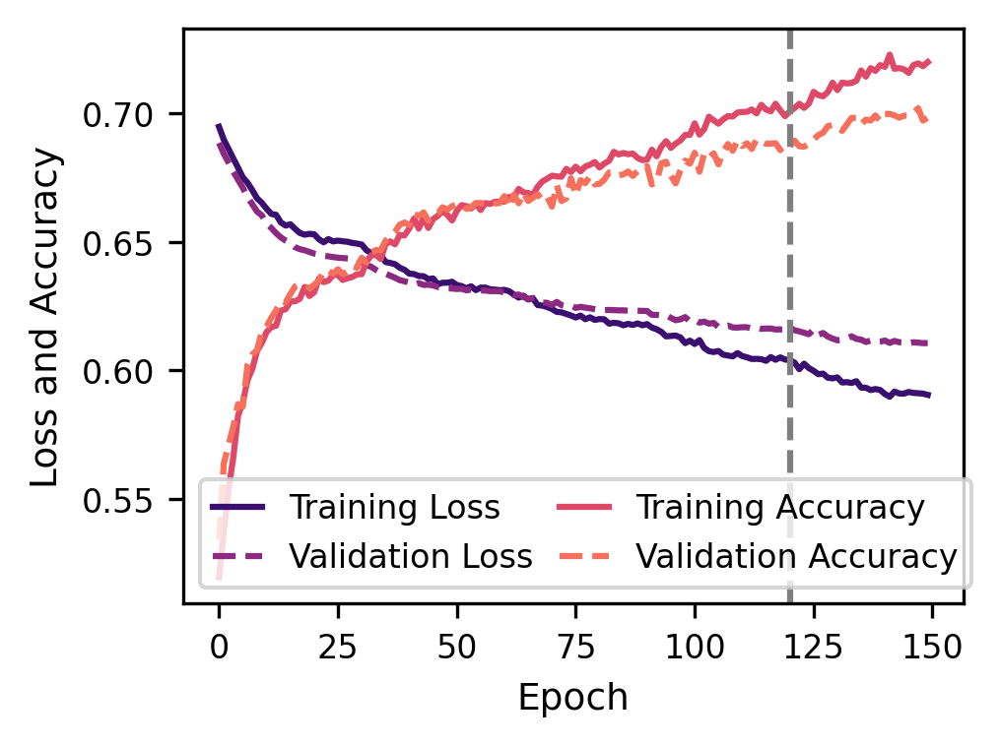

In [21]:
plt.figure(figsize = (3.5,2.6))
plt.plot(np.arange(0,150), trainingloss['train'][0:150], color = color1, label = 'Training Loss')
plt.plot(np.arange(0,150), trainingloss['validation'][0:150], linestyle = '--', color = color3, label = 'Validation Loss')


plt.plot(np.arange(0,150), np.array(trainingacc['train'])[0:150]/100, color = color5, label = 'Training Accuracy')
plt.plot(np.arange(0,150), np.array(trainingacc['validation'])[0:150]/100, linestyle = '--', color = color6, label = 'Validation Accuracy')

plt.axvline(x = checkpoint['epoch'], ymin = 0, ymax = 1, color = 'grey', linestyle="--")
plt.ylabel('Loss and Accuracy') #, fontsize = 'xx-large'
plt.xlabel('Epoch') #, fontsize = 'xx-large'
plt.xticks() #fontsize='large'
plt.yticks() #fontsize='large'
plt.legend(loc=3, ncol = 2, columnspacing=0.8, handlelength=1.5) #, fontsize = 'large'

plt.tight_layout()
plt.savefig('lossANDacc.png', dpi = 300)
plt.show()

In [22]:
# Convert lists to numpy arrays
all_labels = np.array(all_labels)
all_preds = np.array(all_preds)
all_names = np.array(all_names)

In [23]:
print(np.shape(all_labels))

(1254,)


In [24]:
print(np.shape(all_preds))

(1254,)


In [25]:
print(all_preds)

[1 0 1 ... 0 1 0]


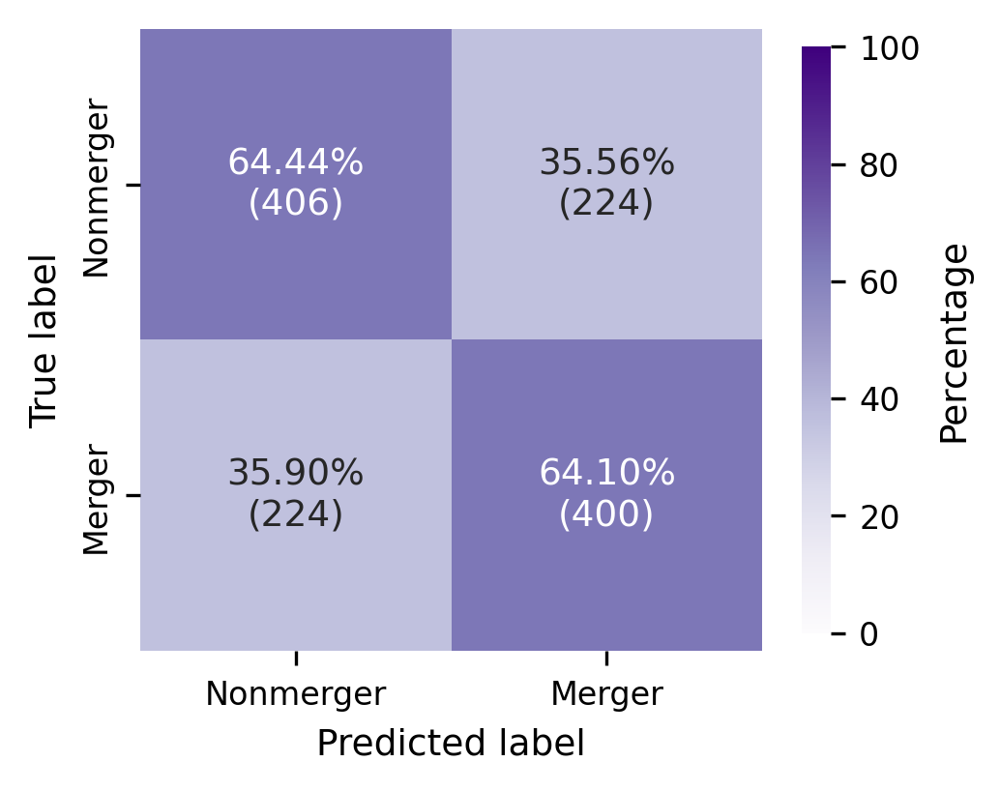

In [26]:
cm = confusion_matrix(all_labels, all_preds)
cmn = (cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]) *100 
TN, FP, FN, TP = cm.ravel()
plot_confusion_matrix(cmn, classes=['Nonmerger', 'Merger'], epoch='Test', cm_raw=cm)


In [27]:
purity = TP / (TP + FP)
completeness = TP / (TP + FN)
print(purity, completeness)

0.6410256410256411 0.6410256410256411


In [28]:
print(np.shape(all_labels))
print(np.shape(all_probabilities[:,0]))
print(np.max(all_probabilities[:,0]))

(1254,)
(1254,)
0.9452548


0.054745194 inf
[0.95202994 0.9398787  0.9368412  0.9342877  0.9329688  0.9129352
 0.91234696 0.90243113 0.89830667 0.88090074 0.87879884 0.86952025
 0.8622378  0.8595874  0.8574708  0.85565263 0.8505955  0.84776884
 0.8458326  0.839473   0.83746725 0.8369254  0.8362708  0.8269046
 0.8241046  0.80674803 0.80487007 0.8048344  0.8037002  0.8034535
 0.80113727 0.79978895 0.79973197 0.7957863  0.79553765 0.79441565
 0.7941679  0.7829819  0.78234744 0.7779243  0.7767768  0.77428126
 0.7739048  0.76873684 0.76762617 0.7580055  0.7553854  0.7525999
 0.7516442  0.7491274  0.74848133 0.737907   0.73769754 0.73526424
 0.735183   0.73505527 0.7344656  0.73122555 0.73063487 0.7281726
 0.72695446 0.7266227  0.7254479  0.71752846 0.71648353 0.7162655
 0.71621203 0.7161272  0.71607536 0.7123785  0.7098519  0.70746815
 0.7073945  0.7030556  0.7020288  0.69989145 0.6993613  0.6956939
 0.6954602  0.69431305 0.6915298  0.6887714  0.6873255  0.68576306
 0.68511254 0.684876   0.6845776  0.68091685 0.680911

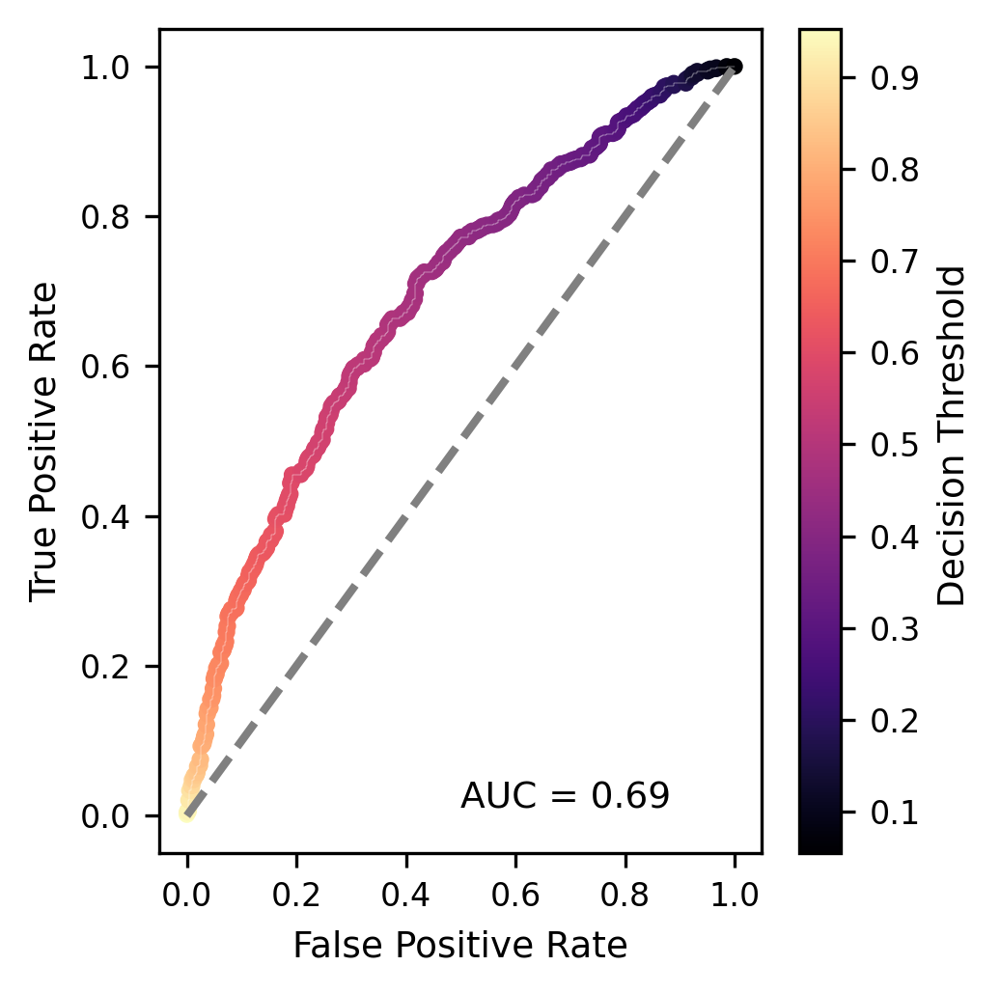

In [29]:
fpr, tpr, thresholds = roc_curve(all_labels, all_probabilities[:,1], pos_label=1)
area = auc(fpr, tpr)
print(np.min(thresholds), np.max(thresholds))
print(thresholds[1:])
#print(fpr, tpr, area)
# Plot ROC curve
plt.figure(figsize=(3.5,3.5))
plt.plot(fpr[1:], tpr[1:], color='white', lw=0.1)
sc = plt.scatter(fpr[1:], tpr[1:], c=thresholds[1:], cmap='magma', s=10)
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.colorbar(sc, label = ' Decision Threshold')
plt.annotate(text = 'AUC = %0.2f' % area, xy=(0.5,0.01))
#plt.title('ROC Test Set')
#plt.legend(loc="lower right", fontsize = 8)
plt.tight_layout()
plt.savefig('ROC_Test_' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()

In [30]:
correct = []
for i in range(len(all_preds)):
    if all_preds[i] == all_labels[i]:
        correct.append('yes')
    else:
        correct.append('no')

In [31]:
string = '102575_1'
string[:-2]

'102575'

In [32]:
ClassificationInfo = pd.DataFrame(all_names, columns=['Image Name'])
ClassificationInfo['True Label'] = all_labels
ClassificationInfo['Predicted Label'] = all_preds
ClassificationInfo['Correct?'] = correct


ClassificationInfo

,Image Name,True Label,Predicted Label,Correct?
0,550306_4,1,1,yes
1,434122_5,1,0,no
2,527829_5,1,1,yes
3,158285_1,0,1,no
4,540685_5,0,0,yes
...,...,...,...,...
1249,678731_5,0,1,no
1250,653351_4,0,0,yes
1251,357887_2,1,0,no
1252,465702_2,1,1,yes


In [33]:
shids = []
for n in ClassificationInfo['Image Name']:
    #print(n[:-2])
    shids.append(n[:-2])
ClassificationInfo['SubhaloID'] = np.array(shids).astype(int)
shids = list(set(shids))
shids = np.array(shids).astype(int)
print(shids)

[163078     12      3 600936 483393 208269 636552 229981 514427 531792
 497826  51921 361774 543958 620813 505778 522373 239266 429842 501001
 573149 531893 683469 375589 577979 653351  79612 244922 319900 179012
  55656 610251 489239 458265 465702 539924 551370 366272 510112 533331
 186578 171741 571205 404548 678731 696171 357887  74669 349396 611832
 459817 463603 167640 270167 385059 248318 288783 584953 299675 346813
 158778 158285 667382 593704 332258 456641 273824 502560 329990 474784
 179807 527829 513935 285389 209243 576456 628945 536542  36236 603110
 197030 435395 186581 286306 207045 349693 217566 167856 544447 168312
 518941 613626 374191 624061 439679 227630 549500 505878  79633     16
 540685 207053 675083 342238 599111 619151 184043 486234 473897 438296
 513041 639298 263790 412395 457265 266035 304170 511733 470024 135873
 445318 477675 531709 524157 183287 227628 559381 623829 463021 519340
 119693 561654 553053 299152 540520 550306 465345 566503 412099 209967
 58294

In [34]:
shids.sort()
print(shids)
print(type(shids[0]))

[     3     12     16     36  25934  36234  36236  51917  51921  55656
  74669  79612  79633  87012 100102 119693 133838 135873 145449 158285
 158778 163078 167640 167856 168312 171738 171741 179012 179807 183287
 184043 186578 186581 197030 203574 207045 207053 208269 209243 209967
 217566 223377 227628 227630 229981 235672 239266 244922 248318 249507
 263790 266035 267974 270167 273824 285389 286306 288783 297404 299152
 299675 304170 308519 319900 329990 332258 338226 340254 342238 346813
 347186 349396 349693 357887 361774 366272 374191 375589 385059 389266
 393931 394377 396451 404548 408628 410422 412099 412395 413070 429842
 431683 431805 434122 435395 437412 437919 438296 439679 445318 445870
 450792 453895 456641 457265 458265 458629 459478 459817 463021 463291
 463603 465345 465702 470024 472772 473897 474784 477675 483393 486234
 489239 492155 492232 495080 496012 497826 499276 501001 502152 502560
 502564 505778 505878 510112 510232 511733 513041 513935 514427 515835
 51894

In [35]:
ClassificationInfo = ClassificationInfo.sort_values(by='SubhaloID')
ClassificationInfo

,Image Name,True Label,Predicted Label,Correct?,SubhaloID
619,3_2,0,0,yes,3
879,3_6,0,0,yes,3
745,3_3,0,1,no,3
1037,3_5,0,0,yes,3
692,3_4,0,0,yes,3
...,...,...,...,...,...
130,696171_2,0,0,yes,696171
1231,696171_4,0,0,yes,696171
1182,696171_5,0,0,yes,696171
366,696171_6,0,0,yes,696171


In [36]:
table40 = pd.read_csv('/n/home09/aschechter/code/SubhaloListForMakeMocks40.csv', usecols = ['Subfind_ID', 'Type'])
table50 = pd.read_csv('/n/home09/aschechter/code/SubhaloListForMakeMocks50.csv', usecols = ['Subfind_ID', 'Type'])
bigtable = pd.concat([table40, table50], ignore_index=False)
bigtable

,Subfind_ID,Type
0,289514,Descendant
1,289514,Descendant
2,289514,Descendant
3,289514,Descendant
4,289514,Descendant
...,...,...
3115,118843,0.0
3116,118843,0.0
3117,118843,0.0
3118,118843,0.0


In [37]:
print(type(bigtable['Subfind_ID'][0]))
print(type(shids[0]))

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


In [38]:
types =[]
for s in shids:
    #print(type(s))
    limit = 6
    result = bigtable.loc[bigtable['Subfind_ID'] == s, 'Type'].values[0]
    print(result)
    while limit != 0:
        types.append(result)
        limit-=1
    

0.0
Descendant
0.0
0.0
0.0
Descendant
Descendant
first_progenitor
0.0
0.0
first_progenitor
Descendant
Merger
Merger
0.0
Descendant
Merger
0.0
Descendant
0.0
0.0
0.0
0.0
first_progenitor
next_progenitor
first_progenitor
first_progenitor
0.0
0.0
next_progenitor
Merger
first_progenitor
0.0
Descendant
first_progenitor
0.0
0.0
next_progenitor
Descendant
0.0
first_progenitor
Merger
Merger
0.0
next_progenitor
0.0
Descendant
0.0
Descendant
0.0
Descendant
0.0
0.0
0.0
0.0
0.0
first_progenitor
0.0
Descendant
0.0
0.0
first_progenitor
0.0
Descendant
Descendant
0.0
Merger
Descendant
Descendant
Descendant
0.0
Descendant
Descendant
Descendant
0.0
first_progenitor
0.0
0.0
next_progenitor
0.0
Descendant
0.0
next_progenitor
0.0
Merger
0.0
0.0
Descendant
first_progenitor
next_progenitor
0.0
first_progenitor
Descendant
first_progenitor
Descendant
0.0
0.0
0.0
Descendant
0.0
0.0
first_progenitor
Merger
0.0
0.0
Merger
Descendant
0.0
0.0
first_progenitor
0.0
0.0
Descendant
next_progenitor
0.0
0.0
Merger
0.0
fi

In [39]:
print(len(types))
ClassificationInfo['Type'] = types
ClassificationInfo

1254


,Image Name,True Label,Predicted Label,Correct?,SubhaloID,Type
619,3_2,0,0,yes,3,0.0
879,3_6,0,0,yes,3,0.0
745,3_3,0,1,no,3,0.0
1037,3_5,0,0,yes,3,0.0
692,3_4,0,0,yes,3,0.0
...,...,...,...,...,...,...
130,696171_2,0,0,yes,696171,0.0
1231,696171_4,0,0,yes,696171,0.0
1182,696171_5,0,0,yes,696171,0.0
366,696171_6,0,0,yes,696171,0.0


### Add Merger Mass Ratio

In [40]:
s_main = 40
s = 40
Subfind_ID_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
Subfind_ID_nonmergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
q_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)
sm_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 5, dtype = float)
sm_nonmergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 2, dtype = float)
sfr_mergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 8, dtype = float)
sfr_nonmergers40 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)

s_main = 50
s = 50
Subfind_ID_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
Subfind_ID_nonmergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 1, dtype = int)
q_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)
sm_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 5, dtype = float)
sm_nonmergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 2, dtype = float)
sfr_mergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/all_mergers_at_' + str(s) + '_enviro.txt', 
                                    skiprows = 1, usecols = 8, dtype = float)
sfr_nonmergers50 = np.loadtxt('/n/holystore01/LABS/hernquist_lab/Users/aschechter/merger_tables/' + str(s_main) + '/nonmergers_matched_at_' + str(s) + '_no_enviro.txt', 
                                    skiprows = 1, usecols = 3, dtype = float)

In [41]:
#print(sfr_nonmergers40)

In [42]:
print()

In [43]:
q= []
sm = []
sfr = []
Subfind_ID = np.concatenate((Subfind_ID_mergers40, Subfind_ID_mergers50))
Subfind_ID_nonmergers = np.concatenate((Subfind_ID_nonmergers40, Subfind_ID_nonmergers50))
q_mergers = np.concatenate((q_mergers40, q_mergers50))
sm_mergers = np.concatenate((sm_mergers40, sm_mergers50))
sm_nonmergers = np.concatenate((sm_nonmergers40, sm_nonmergers50))
sfr_mergers = np.concatenate((sfr_mergers40, sfr_mergers50))
sfr_nonmergers = np.concatenate((sfr_nonmergers40, sfr_nonmergers50))
for s in shids:
    #print(type(s))
    limit = 6
    if s in Subfind_ID:
        index = np.where(Subfind_ID == s)[0][0]
        #print(index[0][0])
        ratio = q_mergers[index]
        stellarmass = np.log10(sm_mergers[index])
        starformation = sfr_mergers[index]
        if ratio < 1:
            while limit != 0:
                q.append(ratio)
                sm.append(stellarmass) 
                sfr.append(starformation)
                limit-=1     
        else:
            while limit != 0:
                q.append(1/ratio)
                sm.append(stellarmass) 
                sfr.append(starformation)
                limit-=1
    else:
        index = np.where(Subfind_ID_nonmergers == s)[0][0]
        while limit != 0:
            q.append(0.0)
            stellarmass = np.log10(sm_nonmergers[index])
            sm.append(stellarmass) 
            starformation = sfr_nonmergers[index]
            sfr.append(starformation)
            limit-=1

q_name = []
for r in q:
    if r== 0.0:
        q_name.append('non')
    elif r >= 0.25:
        q_name.append('major')
    else: 
        q_name.append('minor')
#print(len(q))
ClassificationInfo['Mass Ratio'] = q
ClassificationInfo['Ratio Name'] = q_name
ClassificationInfo['Stellar Mass'] = sm
ClassificationInfo['SFR'] = sfr

In [44]:
ClassificationInfo

,Image Name,True Label,Predicted Label,Correct?,SubhaloID,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
619,3_2,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
879,3_6,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
745,3_3,0,1,no,3,0.0,0.0,non,10.993829,3.223145
1037,3_5,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
692,3_4,0,0,yes,3,0.0,0.0,non,10.993829,3.223145
...,...,...,...,...,...,...,...,...,...,...
130,696171_2,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210
1231,696171_4,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210
1182,696171_5,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210
366,696171_6,0,0,yes,696171,0.0,0.0,non,7.979035,0.045210


In [45]:
p_class = []
t_class = []

for l in ClassificationInfo['True Label']:
    if l == 0:
        t_class.append('nonmerger')
    else:
        t_class.append('merger')

for l in ClassificationInfo['Predicted Label']:
    if l == 0:
        p_class.append('nonmerger')
    else:
        p_class.append('merger')

ClassificationInfo['True Class'] = t_class
ClassificationInfo['Predicted Class'] = p_class

In [46]:
ClassificationInfo = ClassificationInfo.loc[:, ['SubhaloID', 'Image Name', 'True Class', 'Predicted Class', 'True Label', 'Predicted Label', 'Correct?', 'Type', 'Mass Ratio', 'Ratio Name', 'Stellar Mass', 'SFR']]

In [47]:
ClassificationInfo

,SubhaloID,Image Name,True Class,Predicted Class,True Label,Predicted Label,Correct?,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
619,3,3_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
879,3,3_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
745,3,3_3,nonmerger,merger,0,1,no,0.0,0.0,non,10.993829,3.223145
1037,3,3_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
692,3,3_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,10.993829,3.223145
...,...,...,...,...,...,...,...,...,...,...,...,...
130,696171,696171_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1231,696171,696171_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1182,696171,696171_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
366,696171,696171_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210


In [48]:
ClassificationInfo.to_csv('CNN_ResultsTable_' + CNNName + '.csv', index=False)

#### How do we do on major vs minor mergers?

In [49]:
allmergers = ClassificationInfo[ClassificationInfo['Mass Ratio'] != 0.0]
allmergers_correct = allmergers[allmergers['Correct?'] == 'yes']
allmergers_accuracy = np.round(len(allmergers_correct)/len(allmergers) *100, 2)
print(allmergers_accuracy)

64.1


In [50]:
major = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'major']
minor = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'minor']
non = ClassificationInfo[ClassificationInfo['Ratio Name'] == 'non']

major_correct = major[major['Correct?'] == 'yes']
minor_correct = minor[minor['Correct?'] == 'yes']
non_correct = non[non['Correct?'] == 'yes']

major_accuracy = np.round(len(major_correct)/len(major) *100, 2)
minor_accuracy = np.round(len(minor_correct)/len(minor)*100, 2)
non_accuracy = np.round(len(non_correct)/len(non)*100, 2)

print(major_accuracy)
print(minor_accuracy)
print(non_accuracy)

67.73
61.11
64.44


In [51]:
corrects = ClassificationInfo[ClassificationInfo['Correct?'] == 'yes']
print(len(corrects)/len(ClassificationInfo))

0.6427432216905901


#### How do we do on different merger stages?

In [52]:
merger= ClassificationInfo[ClassificationInfo['Type'] == 'Merger']
early = ClassificationInfo[(ClassificationInfo['Type'] == 'first_progenitor') | (ClassificationInfo['Type'] == 'next_progenitor')] #| is or but better for this case
late = ClassificationInfo[ClassificationInfo['Type'] == 'Descendant']

merger_correct = merger[merger['Correct?'] == 'yes']
early_correct = early[early['Correct?'] == 'yes']
late_correct = late[late['Correct?'] == 'yes']

merger_accuracy = np.round(len(merger_correct)/len(merger) *100,2)
early_accuracy = np.round(len(early_correct)/len(early)*100,2)
late_accuracy = np.round(len(late_correct)/len(late)*100,2)



print(merger_accuracy)
print(early_accuracy)
print(late_accuracy)

62.5
71.48
56.41


In [53]:
post = ClassificationInfo[(ClassificationInfo['Type'] == 'Merger') | (ClassificationInfo['Type'] == 'Descendant')] #| is or but better for this case
post_correct = post[post['Correct?'] == 'yes']
post_accuracy = len(post_correct)/len(post)
print(post_accuracy)

0.5847457627118644


## How about stage + mass ratio?

In [54]:
# merger= ClassificationInfo[ClassificationInfo['Type'] == 'Merger']
early = ClassificationInfo[(ClassificationInfo['Type'] == 'first_progenitor') | (ClassificationInfo['Type'] == 'next_progenitor')] #| is or but better for this case
# late = ClassificationInfo[ClassificationInfo['Type'] == 'Descendant']
post = ClassificationInfo[(ClassificationInfo['Type'] == 'Merger') | (ClassificationInfo['Type'] == 'Descendant')]

early_major = early[early['Ratio Name'] == 'major']
early_minor = early[early['Ratio Name'] == 'minor']
post_major = post[post['Ratio Name'] == 'major']
post_minor = post[post['Ratio Name'] == 'minor']

# merger_correct = merger[merger['Correct?'] == 'yes']
early_major_correct = early_major[early_major['Correct?'] == 'yes']
early_minor_correct = early_minor[early_minor['Correct?'] == 'yes']
# late_correct = late[late['Correct?'] == 'yes']
post_major_correct = post_major[post_major['Correct?'] == 'yes']
post_minor_correct = post_minor[post_minor['Correct?'] == 'yes']

# merger_accuracy = np.round(len(merger_correct)/len(merger) *100,2)
early_major_accuracy = len(early_major_correct)/len(early_major)*100
early_minor_accuracy = len(early_minor_correct)/len(early_minor)*100
# late_accuracy = len(late_correct)/len(late)*100
post_major_accuracy = len(post_major_correct)/len(post_major)*100
post_minor_accuracy = len(post_minor_correct)/len(post_minor)*100



print(early_major_accuracy)
print(early_minor_accuracy)
print(post_major_accuracy)
print(post_minor_accuracy)

74.16666666666667
69.33333333333334
62.96296296296296
54.6875


# Which galaxies are classified correctly from every angle?

In [55]:
every_angle_correct = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    
    if a1['Correct?'].values[0] == 'yes' and a2['Correct?'].values[0] == 'yes' and a3['Correct?'].values[0] == 'yes'\
        and a4['Correct?'].values[0] == 'yes' and a5['Correct?'].values[0] == 'yes' and a6['Correct?'].values[0] == 'yes':
        every_angle_correct.append(int(s))
    #print(a1['Correct?'].values[0])
#ClassificationInfo

In [56]:
print(every_angle_correct)

[25934, 55656, 133838, 158778, 167856, 168312, 208269, 209967, 223377, 235672, 244922, 249507, 288783, 299675, 308519, 332258, 338226, 346813, 349693, 366272, 374191, 389266, 413070, 431805, 438296, 445870, 489239, 492155, 502560, 543137, 696171]


In [57]:
EveryAngleCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(every_angle_correct)]
EveryAngleCorrect

,SubhaloID,Image Name,True Class,Predicted Class,True Label,Predicted Label,Correct?,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
1097,25934,25934_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
117,25934,25934_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
220,25934,25934_1,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
974,25934,25934_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
352,25934,25934_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,8.329661,0.000126
...,...,...,...,...,...,...,...,...,...,...,...,...
130,696171,696171_2,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1231,696171,696171_4,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
1182,696171,696171_5,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210
366,696171,696171_6,nonmerger,nonmerger,0,0,yes,0.0,0.0,non,7.979035,0.045210


In [58]:
EveryAngleCorrect.to_csv('EveryAngleCorrect_' + CNNName + '.csv', index=False)

# Which galaxies are classified wrong from every angle?

In [59]:
every_angle_wrong = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    
    if a1['Correct?'].values[0] == 'no' and a2['Correct?'].values[0] == 'no' and a3['Correct?'].values[0] == 'no'\
        and a4['Correct?'].values[0] == 'no' and a5['Correct?'].values[0] == 'no' and a6['Correct?'].values[0] == 'no':
        every_angle_wrong.append(int(s))
    #print(a1['Correct?'].values[0])
#ClassificationInfo
print(every_angle_wrong)

[74669, 158285, 463603, 675083]


In [60]:
EveryAngleWrong = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(every_angle_wrong)]
EveryAngleWrong

,SubhaloID,Image Name,True Class,Predicted Class,True Label,Predicted Label,Correct?,Type,Mass Ratio,Ratio Name,Stellar Mass,SFR
996,74669,74669_2,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
444,74669,74669_6,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
1026,74669,74669_4,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
435,74669,74669_3,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
300,74669,74669_1,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
301,74669,74669_5,merger,nonmerger,1,0,no,first_progenitor,0.112742,minor,11.458124,0.259377
357,158285,158285_5,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800
1089,158285,158285_3,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800
999,158285,158285_2,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800
137,158285,158285_4,nonmerger,merger,0,1,no,0.0,0.000000,non,8.811883,0.568800


In [61]:
EveryAngleWrong.to_csv('EveryAngleWrong_' + CNNName + '.csv', index=False)

# What is the average number of correct angles per galaxy? Does this change with mass ratio?

In [62]:
num_angle_correct = []
num_angle_correct_nm = []
mass_ratio = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    count = 0
    for a in [a1, a2, a3, a4, a5, a6]:
        if a['Correct?'].values[0] == 'yes':
            count+=1
    num_angle_correct.append(count)
    mass_ratio.append(a['Mass Ratio'].values[0])
num_angle_correct = np.array(num_angle_correct) 
mass_ratio = np.array(mass_ratio)     
print(np.mean(np.array(num_angle_correct)))    
print(np.median(np.array(num_angle_correct)))    
print(np.std(np.array(num_angle_correct)))    

3.8564593301435406
4.0
1.5149869800699178


In [63]:
bins = np.arange(-0.5,7,1)

In [64]:
inds = np.where(mass_ratio != 0.0)[0]

In [65]:
print(num_angle_correct[~inds])
print(num_angle_correct[inds])
print(np.mean(num_angle_correct[inds]))
print(np.median(num_angle_correct[inds]))

print(np.mean(num_angle_correct[~inds]))
print(np.median(num_angle_correct[~inds]))

[4 4 5 2 5 4 5 3 3 3 4 3 5 5 4 2 5 1 2 2 4 2 3 3 3 4 3 3 5 5 3 4 4 1 1 5 2
 5 5 4 4 3 4 5 3 4 6 6 2 5 4 5 2 0 2 5 4 3 6 6 2 3 3 4 6 1 3 5 4 6 4 4 5 5
 5 6 6 4 6 4 3 1 4 5 3 5 5 4 6 4 6 3 6 3 5 5 5 3 5 6 6 6 2 5]
[2 3 5 5 0 4 4 5 2 6 5 6 6 5 5 5 3 5 3 5 6 3 4 6 5 5 5 5 3 4 4 4 3 3 6 5 3
 6 5 6 4 6 5 4 4 3 1 6 4 6 3 3 4 1 4 3 3 5 4 4 4 4 5 2 6 6 4 5 3 4 4 4 5 2
 5 5 1 4 3 5 2 4 1 4 5 3 4 2 3 3 2 2 4 3 2 2 1 2 5 5 3 2 3 0]
3.8461538461538463
4.0
3.951923076923077
4.0


In [66]:
# At least 1 angle correct
at_least_1 = [shids[i] for i in range(len(shids)) if num_angle_correct[i] >= 1]
AtLeast1AngleCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(at_least_1)]
print(f"At least 1 angle correct: {len(at_least_1)} galaxies")

# At least 2 angles correct
at_least_2 = [shids[i] for i in range(len(shids)) if num_angle_correct[i] >= 2]
AtLeast2AnglesCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(at_least_2)]
print(f"At least 2 angles correct: {len(at_least_2)} galaxies")

#At least 4 angles correct
at_least_4 = [shids[i] for i in range(len(shids)) if num_angle_correct[i] >= 4]
AtLeast4AnglesCorrect = ClassificationInfo[ClassificationInfo['SubhaloID'].isin(at_least_4)]
print(f"At least 4 angles correct: {len(at_least_4)} galaxies")

n_galaxies = len(shids)
print(f"At least 1 angle: {len(at_least_1)/n_galaxies*100:.2f}%")
print(f"At least 2 angles: {len(at_least_2)/n_galaxies*100:.2f}%")
print(f"At least 4 angles: {len(at_least_4)/n_galaxies*100:.2f}%")
print(f"All 6 angles: {len(every_angle_correct)/n_galaxies*100:.2f}%")

print(len(every_angle_correct))


At least 1 angle correct: 205 galaxies
At least 2 angles correct: 192 galaxies
At least 4 angles correct: 128 galaxies
At least 1 angle: 98.09%
At least 2 angles: 91.87%
At least 4 angles: 61.24%
All 6 angles: 14.83%
31


In [67]:
angles_df_q = pd.DataFrame([])
angles_df_q['Number of Angles Correctly Classified'] = num_angle_correct[inds]
angles_df_q['Mass Ratio'] = mass_ratio[inds]

In [68]:
angles_q_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_q[angles_df_q['Number of Angles Correctly Classified'] == c])
    angles_q_ax2_ylabels.append(str(count))

print(angles_q_ax2_ylabels)

['2', '5', '12', '21', '25', '26', '13']


/tmp/ipykernel_1884275/1104540927.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_q, x="Mass Ratio", y = "Number of Angles Correctly Classified",


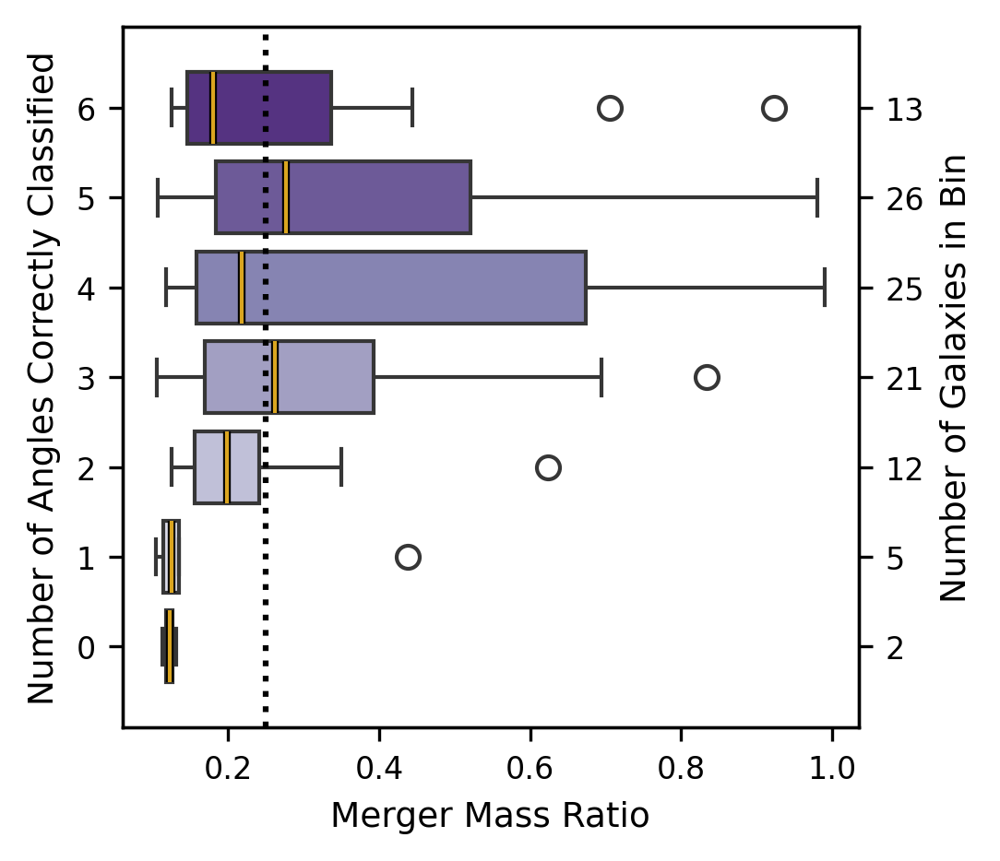

In [69]:
fig, ax = plt.subplots(figsize = (3.5,3), constrained_layout= True)
sns.boxplot(data = angles_df_q, x="Mass Ratio", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples',
            medianprops={"color": "goldenrod", "linewidth": 1, "zorder": 5,
             "path_effects": [pe.withStroke(linewidth=2, foreground="black")]}

            ).set(xlabel = 'Merger Mass Ratio')
    
            
##medianprops={"color": "white", "linewidth": 2, 'zorder': 5,
ax.axvline(x = 0.25, ymin = 0, ymax = 1, color = 'black', linestyle = ':')
ax.set_xlabel('Merger Mass Ratio') #, fontsize = 'x-large'
ax.set_ylabel("Number of Angles Correctly Classified") # fontsize = 'x-large'
# ax.tick_params(labelsize = 'x-large')
plt.ylim(-.9, 6.9)
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
# ax2.tick_params(axis=u'both', which=u'both',length=0, labelsize = 'x-large')
ax2.set_yticklabels(angles_q_ax2_ylabels)
ax2.set_ylabel('Number of Galaxies in Bin') #, fontsize = 'x-large'
plt.savefig('AnglesCorrect_MassRatio' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


# What is the average number of angles correct based on mass?

In [70]:
num_angle_correct = []
num_angle_correct_nm = []
mass = []
for s in shids:
    s = s.astype(str)
    angle1 = s+'_1'
    angle2 = s+'_2'
    angle3 = s+'_3'
    angle4 = s+'_4'
    angle5 = s+'_5'
    angle6 = s+'_6'
    a1 = ClassificationInfo[ClassificationInfo['Image Name'] == angle1]
    a2 = ClassificationInfo[ClassificationInfo['Image Name'] == angle2]
    a3 = ClassificationInfo[ClassificationInfo['Image Name'] == angle3]
    a4 = ClassificationInfo[ClassificationInfo['Image Name'] == angle4]
    a5 = ClassificationInfo[ClassificationInfo['Image Name'] == angle5]
    a6 = ClassificationInfo[ClassificationInfo['Image Name'] == angle6]
    count = 0
    for a in [a1, a2, a3, a4, a5, a6]:
        if a['Correct?'].values[0] == 'yes':
            count+=1
    num_angle_correct.append(count)
    mass.append(a['Stellar Mass'].values[0])
num_angle_correct = np.array(num_angle_correct) 
mass = np.array(mass)     
print(np.mean(np.array(num_angle_correct)))    
print(np.median(np.array(num_angle_correct)))    
print(np.std(np.array(num_angle_correct)))    

3.8564593301435406
4.0
1.5149869800699178


In [71]:
inds = np.where(mass_ratio != 0.0)[0]

In [72]:
angles_df_sm_mergers = pd.DataFrame([])
angles_df_sm_mergers['Number of Angles Correctly Classified'] = num_angle_correct[inds]
angles_df_sm_mergers['Stellar Mass'] = mass[inds]

angles_df_sm_nonmergers = pd.DataFrame([])
angles_df_sm_nonmergers['Number of Angles Correctly Classified'] = num_angle_correct[~inds]
angles_df_sm_nonmergers['Stellar Mass'] = mass[~inds]

In [73]:
angles_sm_mergers_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_sm_mergers[angles_df_sm_mergers['Number of Angles Correctly Classified'] == c])
    angles_sm_mergers_ax2_ylabels.append(str(count))

print(angles_sm_mergers_ax2_ylabels)

angles_sm_nonmergers_ax2_ylabels = []
for c in range(7):
    count = len(angles_df_sm_nonmergers[angles_df_sm_nonmergers['Number of Angles Correctly Classified'] == c])
    angles_sm_nonmergers_ax2_ylabels.append(str(count))

print(angles_sm_nonmergers_ax2_ylabels)

['2', '5', '12', '21', '25', '26', '13']
['1', '5', '11', '21', '24', '27', '15']


/tmp/ipykernel_1884275/1158797746.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_sm_mergers, x="Stellar Mass", y = "Number of Angles Correctly Classified",


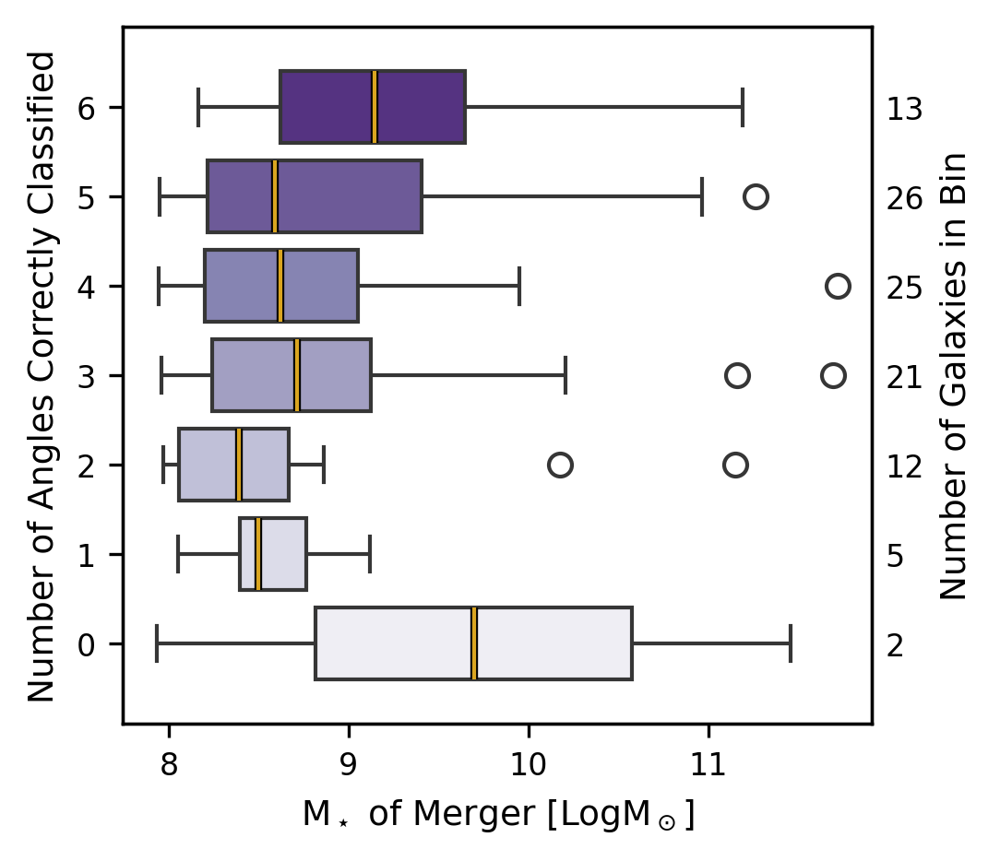

/tmp/ipykernel_1884275/1158797746.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data = angles_df_sm_nonmergers, x="Stellar Mass", y = "Number of Angles Correctly Classified",


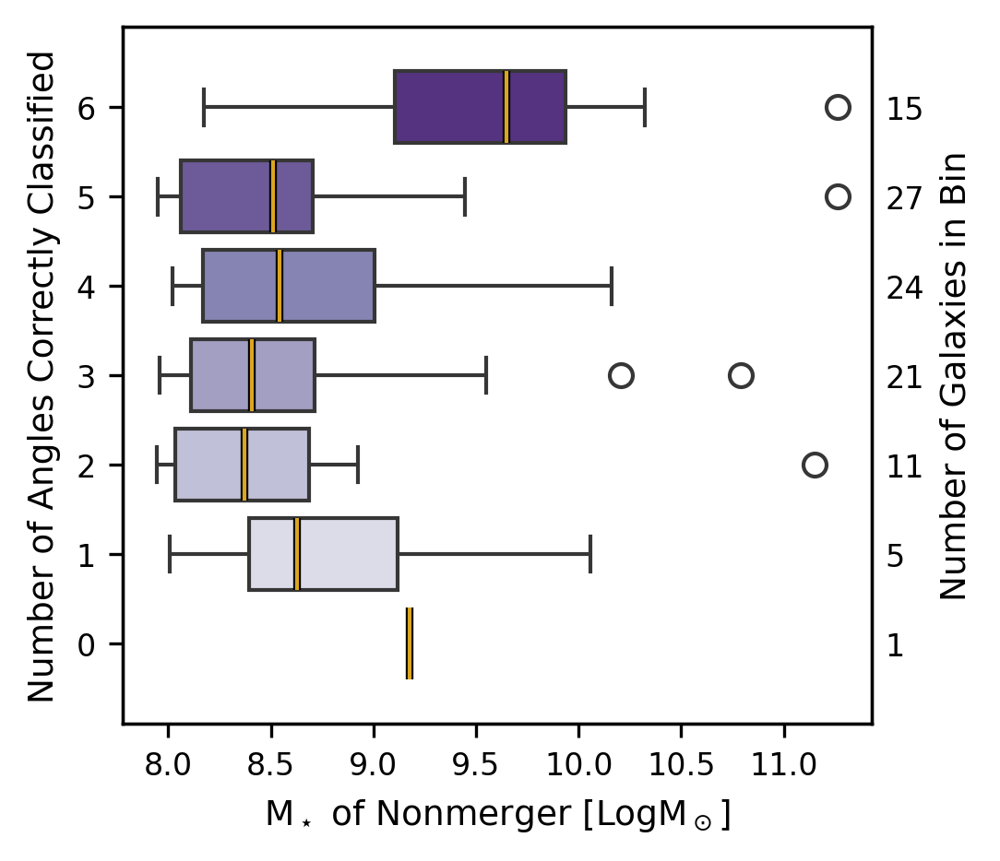

In [74]:
fig, ax = plt.subplots(figsize = (3.5,3), constrained_layout=True)
sns.boxplot(data = angles_df_sm_mergers, x="Stellar Mass", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples',
            medianprops={"color": "goldenrod", "linewidth": 1, "zorder": 5,
             "path_effects": [pe.withStroke(linewidth=2, foreground="black")]}).set(xlabel = r"M$_\star$ of Merger [LogM$_\odot$]")
plt.ylim(-.9, 6.9)
ax.set_xlabel(r"M$_\star$ of Merger [LogM$_\odot$]") #, fontsize = 'x-large'
ax.set_ylabel("Number of Angles Correctly Classified") #,fontsize = 'x-large'
# ax.tick_params(labelsize = 'x-large')
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.tick_params(axis=u'both', which=u'both',length=0) #, labelsize = 'x-large'
ax2.set_yticklabels(angles_sm_mergers_ax2_ylabels) #, fontsize = 'x-large'
ax2.set_ylabel('Number of Galaxies in Bin') #, fontsize = 'x-large'
#plt.tight_layout()
plt.savefig('AnglesCorrect_StellarMass_Merger' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


fig, ax = plt.subplots(figsize = (3.5,3), constrained_layout=True)
sns.boxplot(data = angles_df_sm_nonmergers, x="Stellar Mass", y = "Number of Angles Correctly Classified", 
            dodge = False, orient = 'h', palette='Purples',
            medianprops={"color": "goldenrod", "linewidth": 1, "zorder": 5,
             "path_effects": [pe.withStroke(linewidth=2, foreground="black")]}).set(xlabel = r"M$_\star$ of Nonmerger [LogM$_\odot$]",)
plt.ylim(-.9, 6.9)
ax.set_xlabel(r"M$_\star$ of Nonmerger [LogM$_\odot$]") #, fontsize = 'x-large'
ax.set_ylabel("Number of Angles Correctly Classified") #,fontsize = 'x-large'
# ax.tick_params(labelsize = 'x-large')
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(ax.get_yticks())
ax2.tick_params(axis=u'both', which=u'both',length=0) #, labelsize = 'x-large'
ax2.set_yticklabels(angles_sm_nonmergers_ax2_ylabels) #, fontsize = 'x-large'
ax2.set_ylabel('Number of Galaxies in Bin') #, fontsize = 'x-large'
#plt.tight_layout()
plt.savefig('AnglesCorrect_StellarMass_Nonmerger' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()


# SFR with right or wrong

In [75]:
cmap = matplotlib.colormaps['magma']

mergers_color = cmap(0.2)
nonmergers_color = cmap(0.7)
nonmergers_color_wrong = cmap(0.65)
nonmergers_line = cmap(0.55)

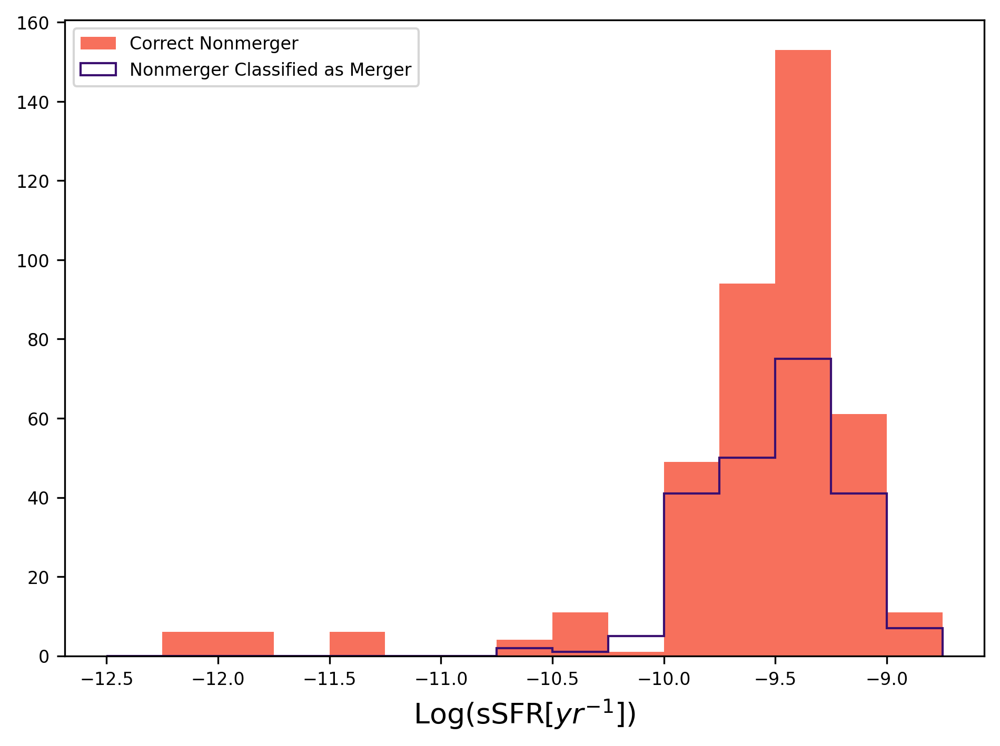

In [76]:
nonmerger_sfr = ClassificationInfo[ClassificationInfo['Mass Ratio']== 0.0]['SFR']
nonmerger_mass = ClassificationInfo[ClassificationInfo['Mass Ratio']== 0.0]['Stellar Mass']
nonmerger_mass = 10**nonmerger_mass
nonmerger_ssfr = nonmerger_sfr/nonmerger_mass

nonmerger_sfr_correct = nonmerger_sfr[ClassificationInfo['Correct?'] == 'yes']
nonmerger_sfr_incorrect = nonmerger_sfr[ClassificationInfo['Correct?'] == 'no']

nonmerger_ssfr_correct = nonmerger_ssfr[ClassificationInfo['Correct?'] == 'yes']
nonmerger_ssfr_incorrect = nonmerger_ssfr[ClassificationInfo['Correct?'] == 'no']

plt.figure()
plt.hist(np.log10(nonmerger_ssfr_correct), color = nonmergers_color, bins = np.arange(-12.5, -8.5, 0.25), label = 'Correct Nonmerger')
plt.hist(np.log10(nonmerger_ssfr_incorrect), color = mergers_color, histtype = 'step', bins = np.arange(-12.5, -8.5, 0.25), label = 'Nonmerger Classified as Merger')
plt.xlabel(r'Log(sSFR[$yr^{-1}$])', fontsize = 'x-large')
plt.legend()
plt.tight_layout()

plt.show()
#ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]

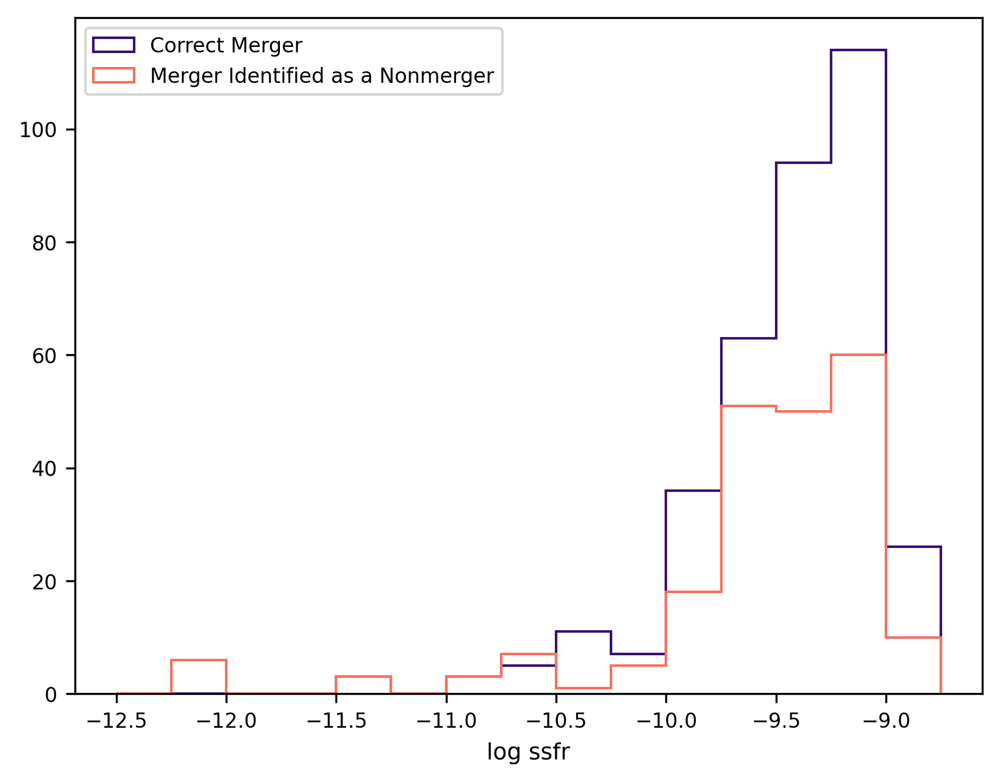

In [77]:
merger_sfr = ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]['SFR']
merger_mass = ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]['Stellar Mass']
merger_mass = 10**merger_mass
merger_ssfr = merger_sfr/merger_mass

merger_sfr_correct = merger_sfr[ClassificationInfo['Correct?'] == 'yes']
merger_sfr_incorrect = merger_sfr[ClassificationInfo['Correct?'] == 'no']

merger_ssfr_correct = merger_ssfr[ClassificationInfo['Correct?'] == 'yes']
merger_ssfr_incorrect = merger_ssfr[ClassificationInfo['Correct?'] == 'no']

plt.figure()
plt.hist(np.log10(merger_ssfr_correct), color = mergers_color, histtype = 'step', bins = np.arange(-12.5, -8.5, 0.25), label = 'Correct Merger')
plt.hist(np.log10(merger_ssfr_incorrect), color = nonmergers_color, histtype = 'step', bins = np.arange(-12.5, -8.5, 0.25), label = 'Merger Identified as a Nonmerger')
plt.xlabel('log ssfr')
plt.legend()
plt.show()
#ClassificationInfo[ClassificationInfo['Mass Ratio']!= 0.0]

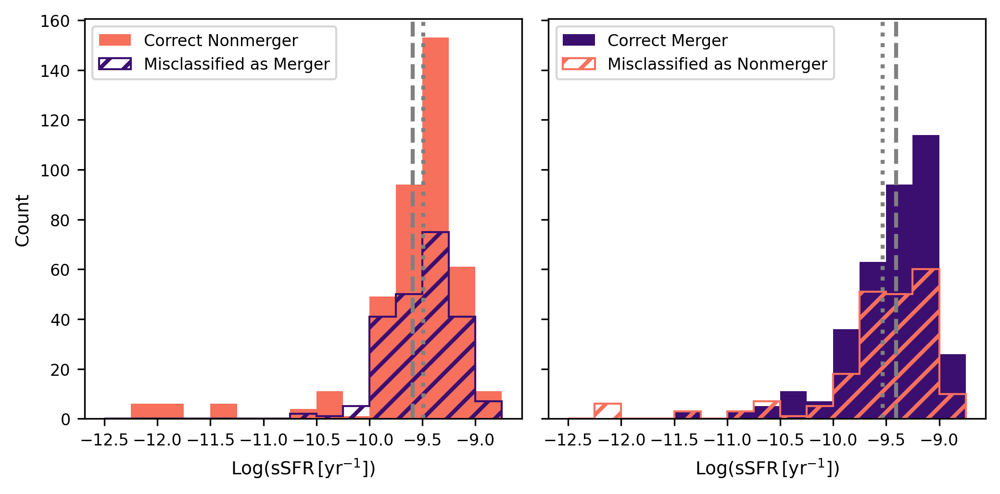

In [78]:
plt.rcParams['hatch.linewidth'] = 2.0 
fig, axes = plt.subplots(1, 2, figsize=(7,3.5), sharey=True)  # 2 columns, 1 row

# Panel 1: Nonmergers
axes[0].hist(np.log10(nonmerger_ssfr_correct), color=nonmergers_color, 
             bins=np.arange(-12.5, -8.5, 0.25), label='Correct Nonmerger')
axes[0].hist(np.log10(nonmerger_ssfr_incorrect), color=mergers_color,
             histtype='step', hatch='//', bins=np.arange(-12.5, -8.5, 0.25), label='Misclassified as Merger')
axes[0].axvline(np.mean(np.log10(nonmerger_ssfr_correct)), color = 'grey', linestyle = '--', linewidth = 2)
axes[0].axvline(np.mean(np.log10(nonmerger_ssfr_incorrect)), color = 'grey', linestyle = ':', linewidth = 2)
axes[0].set_xlabel(r'Log$(\mathrm{sSFR}\,[\mathrm{yr}^{-1}])$') #, fontsize='x-large'
axes[0].set_ylabel('Count') #, fontsize='x-large'
axes[0].legend( loc = 'upper left') #fontsize='medium',

# Panel 2: Mergers
axes[1].hist(np.log10(merger_ssfr_correct), color=mergers_color,  
             bins=np.arange(-12.5, -8.5, 0.25), label='Correct Merger')
axes[1].hist(np.log10(merger_ssfr_incorrect), color=nonmergers_color, histtype = 'step', hatch = '//',
             bins=np.arange(-12.5, -8.5, 0.25), label='Misclassified as Nonmerger')
axes[1].axvline(np.mean(np.log10(merger_ssfr_incorrect)), color = 'grey', linestyle = ':', linewidth =2)
axes[1].axvline(np.mean(np.log10(merger_ssfr_correct)), color = 'grey', linestyle = '--', linewidth = 2)

axes[1].set_xlabel(r'Log$(\mathrm{sSFR}\,[\mathrm{yr}^{-1}])$') #, fontsize='x-large'
axes[1].legend( loc = 'upper left') #fontsize='medium',


# Adjust layout
plt.tight_layout()
plt.savefig('ssfr_rightandwrong.png', dpi=300, bbox_inches='tight')
plt.show()

# Calibration Error

## Brier Score

In [79]:
brier = brier_score_loss(y_true = all_labels, y_proba = all_probabilities[:,1], pos_label = 1)
print(brier)

0.22357529779683724


## Expected Calibration Error

In [80]:
#confidences = probabiliies (I think we use all_probabilities here)
print(all_probabilities)
print(np.min(all_probabilities))
print(type(all_labels[0]))

[[0.3271597  0.6728403 ]
 [0.7900533  0.2099467 ]
 [0.4748066  0.52519345]
 ...
 [0.5148981  0.48510185]
 [0.49393538 0.50606465]
 [0.6943856  0.30561435]]
0.04797001
<class 'numpy.int64'>


In [81]:
#https://towardsdatascience.com/expected-calibration-error-ece-a-step-by-step-visual-explanation-with-python-code-c3e9aa12937d/
def ECE(samples, labels, numbins = 10):
    # uniform binning approach with M number of bins
    bin_boundaries = np.linspace(0, 1, numbins + 1)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]
    
    # get max probability per sample i
    confidences = np.max(samples, axis=1)
    # get predictions from confidences (positional in this case)
    predicted_label = np.argmax(samples, axis=1)
    
    # get a boolean list of correct/false predictions
    accuracies = predicted_label==labels

    ece = np.zeros(1)
    bin_accs = []
    bin_confs = []
    bin_nums = [] 
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        # determine if sample is in bin m (between bin lower &amp; upper)
        in_bin = np.logical_and(confidences > bin_lower.item(), confidences <= bin_upper.item())
        nums= in_bin.sum()
        # can calculate the empirical probability of a sample falling into bin m: (|Bm|/n)
        prob_in_bin = in_bin.mean()

        if prob_in_bin.item() > 0:
            bin_nums.append(nums)
            # get the accuracy of bin m: acc(Bm)
            accuracy_in_bin = accuracies[in_bin].mean()
            bin_accs.append(accuracy_in_bin)
            # get the average confidence of bin m: conf(Bm)
            avg_confidence_in_bin = confidences[in_bin].mean()
            bin_confs.append(avg_confidence_in_bin)
            # calculate |acc(Bm) - conf(Bm)| * (|Bm|/n) for bin m and add to the total ECE
            ece += np.abs(avg_confidence_in_bin - accuracy_in_bin) * prob_in_bin
        else:
            bin_accs.append(np.nan)
            bin_confs.append(np.nan)
            bin_nums.append(np.nan)
    return ece, np.array(bin_accs), np.array(bin_confs), bin_nums

In [82]:
ece, accs, confs, nums = ECE(all_probabilities, all_labels)
gap = confs - accs
print(ece)

[0.03249877]


In [83]:
print(nums)

[nan, nan, nan, nan, nan, 485, 374, 224, 124, 47]


In [84]:
print(accs)

bin_boundaries = np.linspace(0, 1, 10 + 1)
bin_lowers = bin_boundaries[:-1]
bin_uppers = bin_boundaries[1:]

bin_centers = ((bin_uppers - bin_lowers) /2) + bin_boundaries[:-1]
print(bin_centers)

[       nan        nan        nan        nan        nan 0.57319588
 0.62566845 0.70535714 0.75806452 0.89361702]
[0.05 0.15 0.25 0.35 0.45 0.55 0.65 0.75 0.85 0.95]


In [85]:
print(gap)

[        nan         nan         nan         nan         nan -0.02300447
  0.02167668  0.04148065  0.08825522  0.02667869]


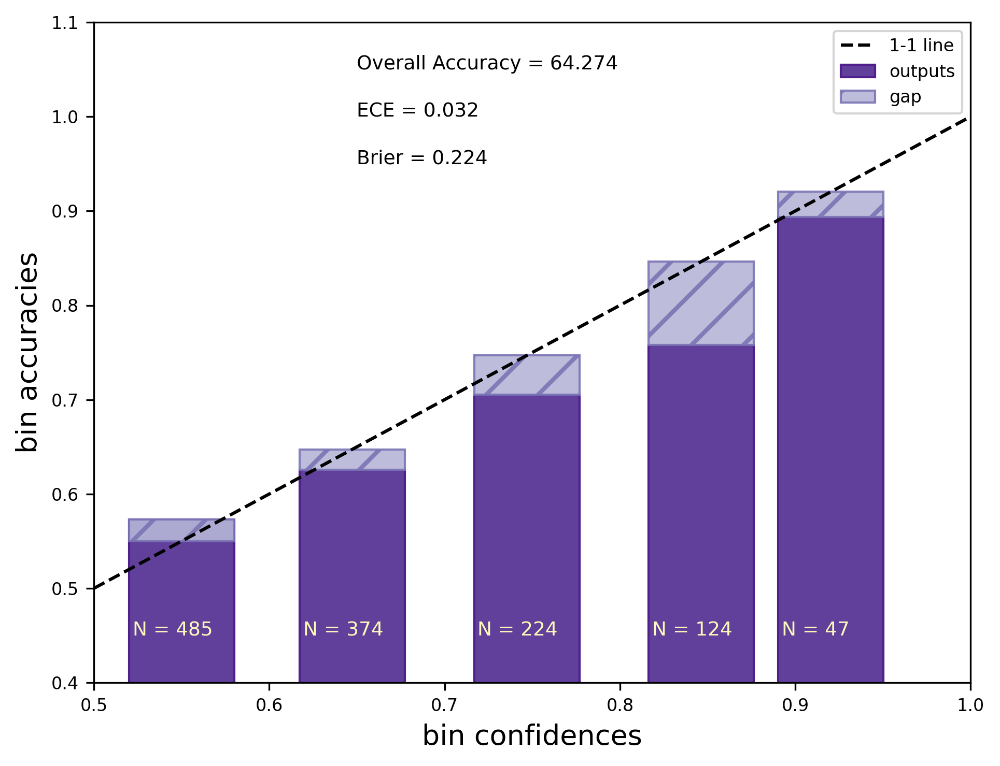

In [86]:
purples = matplotlib.colormaps['Purples']
fig, ax = plt.subplots(figsize=(width*2, height*2))
plt.bar(confs, accs, width = 0.06, edgecolor = purples(0.9), color = purples(0.8), label = 'outputs')
plt.bar(confs, gap, bottom = accs, width = 0.06, hatch = '/', edgecolor = purples(0.65), color = purples(0.4), label = 'gap', alpha = 0.9)
ax.axline((0, 0), slope=1, color='k', linestyle='--', label='1-1 line')
plt.xlabel('bin confidences', fontsize = 'x-large')
plt.ylabel('bin accuracies', fontsize = 'x-large')
#plt.title(CNNName)
plt.ylim(0.4,1.1)
plt.xlim(0.5,1)
ax.annotate(text = 'Overall Accuracy = ' + str(np.round(test_accuracy,3)), xy = (0.65, 1.05))
ax.annotate(text = 'ECE = ' + str(np.round(ece[0],3)), xy = (0.65, 1))
ax.annotate(text = 'Brier = ' + str(np.round(brier,3)), xy = (0.65, 0.95))
for i in range(len(nums)):
    ax.annotate(text = 'N = ' +str(nums[i]), xy = (confs[i]-0.028, 0.45), color = cmap(0.99))
plt.legend()
plt.tight_layout()
plt.savefig('ECE_' + CNNName + '.png', dpi = 300, bbox_inches="tight")
plt.show()

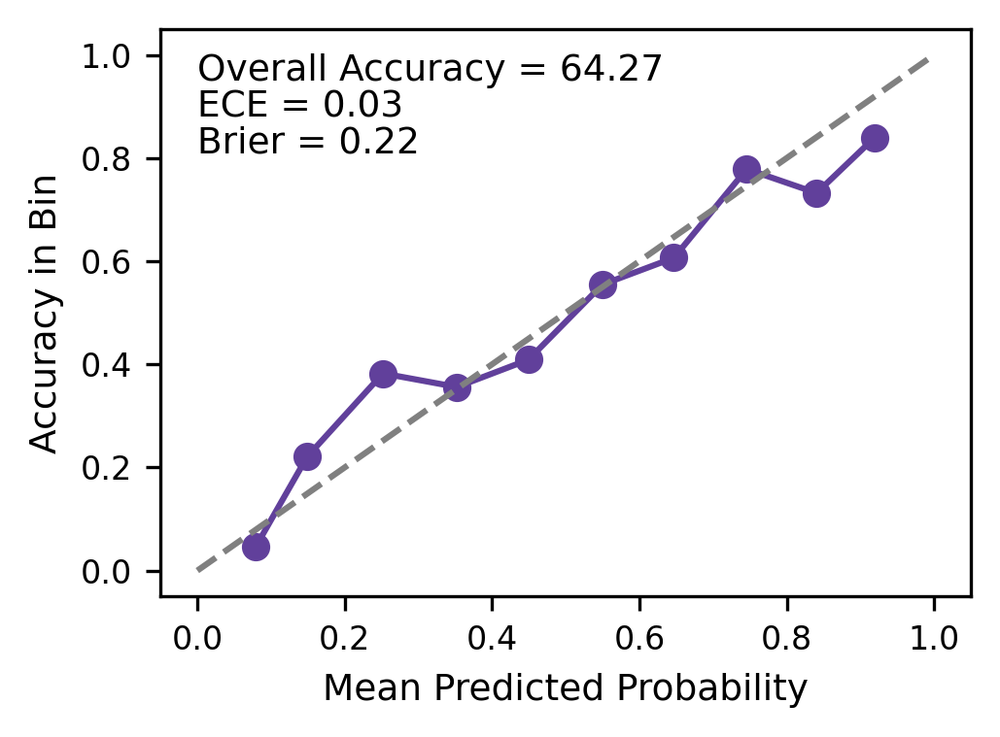

In [87]:
# Compute calibration curve
prob_true, prob_pred = calibration_curve(all_labels, all_probabilities[:, 1], n_bins=10, strategy='uniform', pos_label = 1)
#print(prob_true)
# Plot
plt.figure(figsize=(3.5, 2.6))
plt.plot(prob_pred, prob_true, marker='o', color = purples(0.8))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Mean Predicted Probability') #, fontsize = 'x-large'
plt.ylabel('Accuracy in Bin') #, fontsize = 'x-large'
plt.annotate(text = 'Overall Accuracy = ' + str(np.round(test_accuracy,2)), xy = (0, 0.95))
plt.annotate(text = 'ECE = ' + str(np.round(ece[0],2)), xy = (0, 0.88))
plt.annotate(text = 'Brier = ' + str(np.round(brier,2)), xy = (0, 0.81))
plt.tight_layout()
plt.savefig('CalibrationCurve.png', dpi = 300)
plt.show()

# UMAP

In [88]:
cmap = matplotlib.colormaps['magma']

mergers_color = cmap(0.2)
nonmergers_color = cmap(0.7)
colors = [mergers_color, nonmergers_color]  # List of colors
cmap_name = "my_cmap"  # Name for your colormap
cmap_binary = LinearSegmentedColormap.from_list(cmap_name, colors)
print(cmap_binary)


In [ ]:
# custom labels
wordlabels = []

for l in range(len(all_labels_for_umap_plot)):
    if all_labels_for_umap_plot[l] == 0:
        wordlabels.append('nonmerger')
    else:
        wordlabels.append('merger')
        
print(wordlabels)

['merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'no

In [ ]:
np.array(all_labels) == np.array(all_labels_for_umap_plot)

array([ True,  True,  True, ...,  True,  True,  True])

In [94]:
# custom pred labels
pred_wordlabels = []

for l in range(len(all_preds)):
    if all_preds[l] == 0:
        pred_wordlabels.append('merger')
    else:
        pred_wordlabels.append('nonmerger')
        
print(pred_wordlabels)

['nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'merger', 'nonmerger', 'nonmerger', 'nonmerger', 'merger', 'merger', 'merger', 'nonmerger', 'nonmerger',

In [ ]:
masses_in_order = []

for name in all_names:
    mass = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Stellar Mass'].iloc[0]
    masses_in_order.append(mass)
masses_in_order = np.array(masses_in_order)
norm_mass = Normalize(vmin=np.min(masses_in_order), vmax=np.max(masses_in_order)+0.5)


In [ ]:
ratios_in_order = []

for name in all_names:
    ratio = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Mass Ratio'].iloc[0]
    ratios_in_order.append(ratio)
    
print(ratios_in_order)
ratios_in_order = np.array(ratios_in_order)
zero_ratio_indices = np.where(ratios_in_order == 0.0)[0]
non_zero_ratio_indices = np.where(ratios_in_order != 0.0)[0]


[0.20243274, 0.10546916, 0.19640149, 0.0, 0.0, 0.19640149, 0.0, 0.0, 0.0, 0.0, 0.1562853, 0.99038935, 0.0, 0.34962659999999995, 0.10546916, 0.0, 0.0, 0.0, 0.0, 0.7758559825091027, 0.8818440999999999, 0.18267076, 0.5917554383656235, 0.0, 0.0, 0.0, 0.0, 0.14225239, 0.7429124112953295, 0.0, 0.0, 0.13636528, 0.18298434, 0.0, 0.0, 0.18986602, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15954891, 0.43834287, 0.19418514, 0.0, 0.0, 0.0, 0.76816285, 0.0, 0.0, 0.18663451, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.16998231, 0.24320558, 0.0, 0.39276493, 0.18267076, 0.0, 0.0, 0.28760183, 0.0, 0.0, 0.8322622811327057, 0.0, 0.24987264, 0.0, 0.0, 0.0, 0.0, 0.5891441999999999, 0.24987264, 0.99038935, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8177481, 0.1851274, 0.16474542, 0.0, 0.43834287, 0.13636528, 0.0, 0.0, 0.13572223, 0.0, 0.111217, 0.11758917, 0.0, 0.0, 0.0, 0.0, 0.18663451, 0.2541805, 0.0, 0.0, 0.8322622811327057, 0.0, 0.13579404, 0.0, 0.25151910000000005, 0.0, 0.8322622811327057, 0.29991812, 0.33709320000000004

In [ ]:
types_in_order = []

for name in all_names:
    typeofmerg = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Type'].iloc[0]
    types_in_order.append(typeofmerg)
    
print(types_in_order)
types_in_order = np.array(types_in_order)
nostage = np.where(types_in_order == '0.0')[0]
earlystage = np.where((types_in_order == 'first_progenitor') | (types_in_order == 'next_progenitor'))[0]
latestage = np.where((types_in_order == 'Merger') | (types_in_order == 'Descendant'))[0]



['Merger', 'Descendant', 'first_progenitor', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', '0.0', '0.0', 'Merger', 'Merger', '0.0', 'Descendant', 'Descendant', '0.0', '0.0', '0.0', '0.0', 'next_progenitor', 'Descendant', 'next_progenitor', 'Descendant', '0.0', '0.0', '0.0', '0.0', 'Merger', 'first_progenitor', '0.0', '0.0', 'first_progenitor', 'Descendant', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', 'first_progenitor', 'Descendant', 'first_progenitor', '0.0', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', 'next_progenitor', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', 'first_progenitor', 'Descendant', '0.0', 'first_progenitor', 'next_progenitor', '0.0', '0.0', 'first_progenitor', '0.0', '0.0', 'Descendant', '0.0', 'Descendant', '0.0', '0.0', '0.0', '0.0', 'Descendant', 'Descendant', 'Merger', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', '0.0', 'next_progenitor', 'first_progenitor', 'Descendant', '0.0', 'Descendant', 'first_progenitor', '0.0',

In [ ]:
sfrs_in_order = []

for name in all_names:
    sfr = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'SFR'].iloc[0]
    sfrs_in_order.append(sfr)
    
log_sfr_array = np.log10(np.array(sfrs_in_order))
norm_sfr = Normalize(vmin=np.min(log_sfr_array), vmax=np.max(log_sfr_array))


In [ ]:
sfrs_in_order = []

for name in all_names:
    sfr = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'SFR'].iloc[0]
    sfrs_in_order.append(sfr)
log_sfr_array = np.log10(np.array(sfrs_in_order))

In [ ]:
sfrs_in_order = []

for name in all_names:
    sfr = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'SFR'].iloc[0]
    sfrs_in_order.append(sfr)


In [ ]:
masses_in_order = []

for name in all_names:
    mass = ClassificationInfo.loc[ClassificationInfo['Image Name'] == str(name), 'Stellar Mass'].iloc[0]
    masses_in_order.append(mass)
masses_in_order = np.array(masses_in_order)



In [103]:
reducer = umap.UMAP(n_components=2, n_neighbors=50, random_state=626)

umap_embedding = reducer.fit_transform(all_extracted_features)

/n/home09/aschechter/.conda/envs/zoobot2/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [104]:
reducer_enc = umap.UMAP(n_components=2, n_neighbors=50, random_state=626)
umap_embedding_enc = reducer_enc.fit_transform(all_encoder_features)
print("Encoder UMAP embedding shape:", umap_embedding_enc.shape)

/n/home09/aschechter/.conda/envs/zoobot2/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Encoder UMAP embedding shape: (1254, 2)


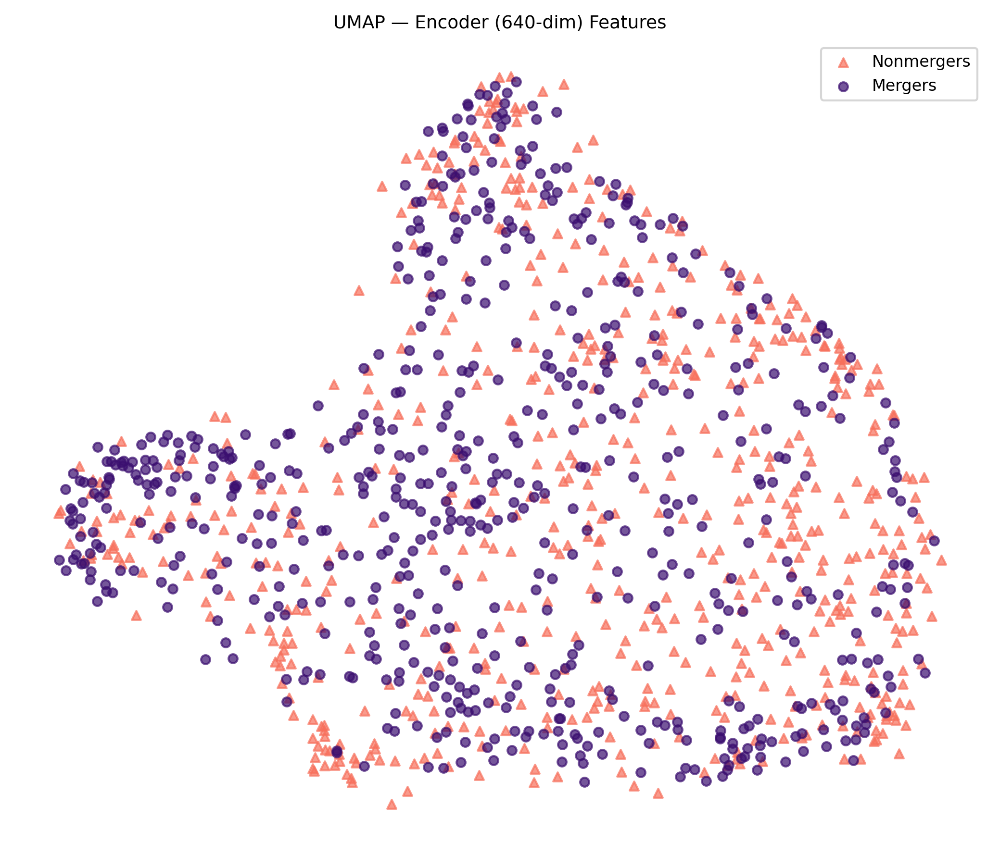

In [ ]:
merger_mask = (all_labels_for_umap_plot == 1)
nonmerger_mask = (all_labels_for_umap_plot == 0)

plt.figure(figsize=(7, 6))
plt.axis('off')
plt.scatter(
    umap_embedding_enc[nonmerger_mask, 0],
    umap_embedding_enc[nonmerger_mask, 1],
    color=nonmergers_color, alpha=0.7, s=20, marker='^', label='Nonmergers'
)
plt.scatter(
    umap_embedding_enc[merger_mask, 0],
    umap_embedding_enc[merger_mask, 1],
    color=mergers_color, alpha=0.7, s=20, marker='o', label='Mergers'
)
plt.legend()
plt.title('UMAP — Encoder (640-dim) Features')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
# plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [106]:
print("UMAP embedding shape:", umap_embedding.shape) # Should be (num_samples, 2)

UMAP embedding shape: (1254, 2)


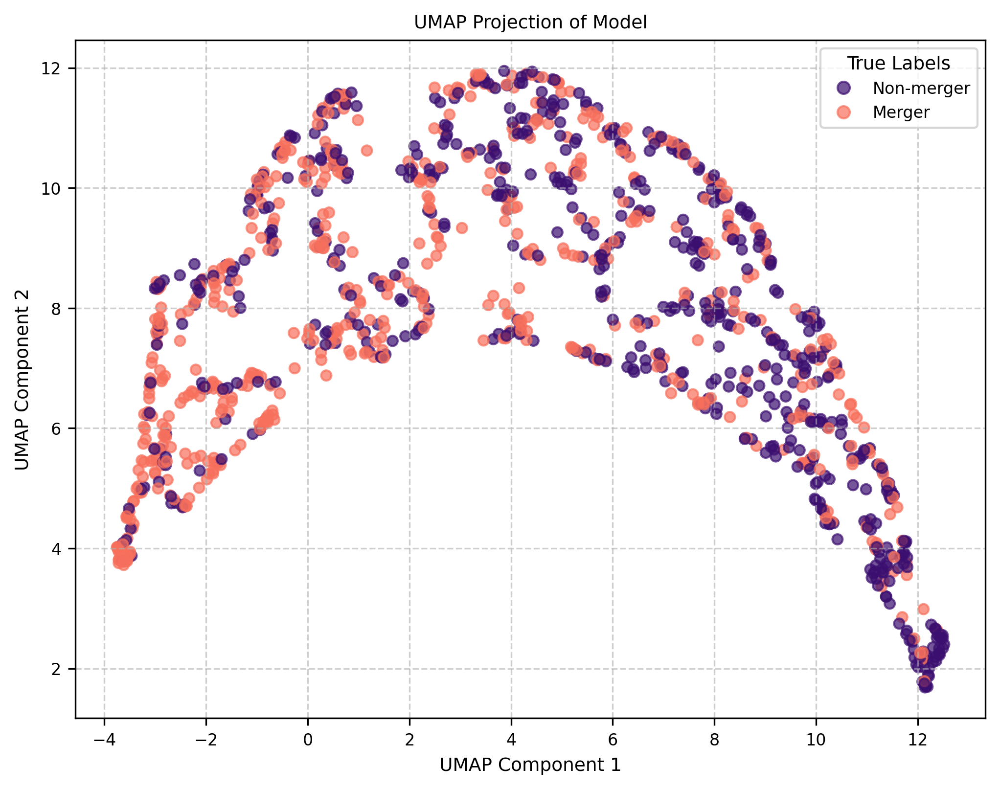

In [107]:
plt.figure(figsize=(8, 6))

# Define custom labels for the legend
custom_labels = {1: 'Merger', 0: 'Non-merger'}
legend_labels = [custom_labels[label] for label in sorted(np.unique(all_labels))]

# You can color the points by their true labels (all_labels)
# or by predicted labels (all_preds) to see how well they separate.
scatter = plt.scatter(
    umap_embedding[:, 0],
    umap_embedding[:, 1],
    c=all_labels, # Color by true labels
    cmap=cmap_binary, # Choose a colormap, e.g., 'viridis', 'plasma', 'coolwarm'
    s=25,           # Marker size
    alpha=0.7       # Transparency
)


#plt.axes('off')
# Add legend for true labels
handles, _ = scatter.legend_elements() # Get default handles for the scatter points
plt.legend(handles=handles, labels=legend_labels, title="True Labels")

plt.title('UMAP Projection of Model')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

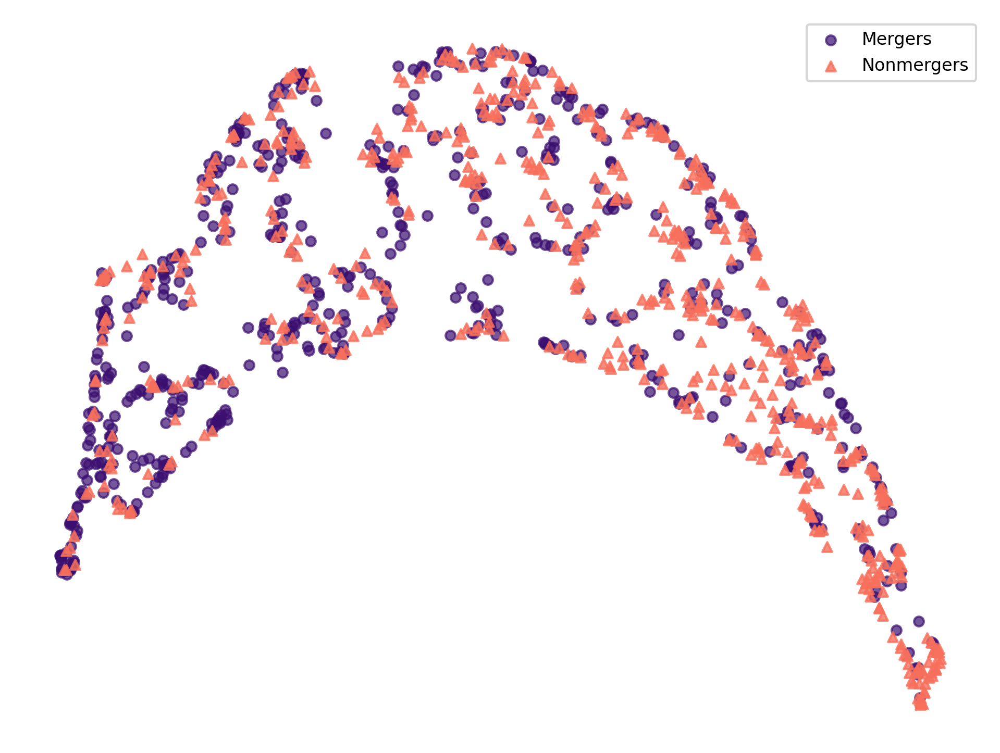

In [108]:
plt.figure(figsize=(8,6))
plt.axis('off')
# Identify indices for mass ratio = 0 and mass ratio != 0
# Filter out NaNs if any were introduced
valid_indices = ~np.isnan(ratios_in_order)
zero_ratio_indices = np.where((ratios_in_order == 0) & valid_indices)[0]
non_zero_ratio_indices = np.where((ratios_in_order != 0) & valid_indices)[0]

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    #c=ratios_in_order[non_zero_ratio_indices], # Color by mass ratio
    color=mergers_color,       # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.7,
    s = 20,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
# cbar = plt.colorbar(scatter_non_zero)
# cbar.set_label('Mass Ratio')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    color=nonmergers_color,       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    s=20,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    label='Nonmergers'
)

#plt.title('UMAP Projection (colored by Mass Ratio)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True, linestyle='--', alpha=0.6)

# Add a legend for the fixed-color 'Mass Ratio = 0' points
plt.legend(loc='best') # 'best' attempts to place it where it won't overlap much

plt.show()


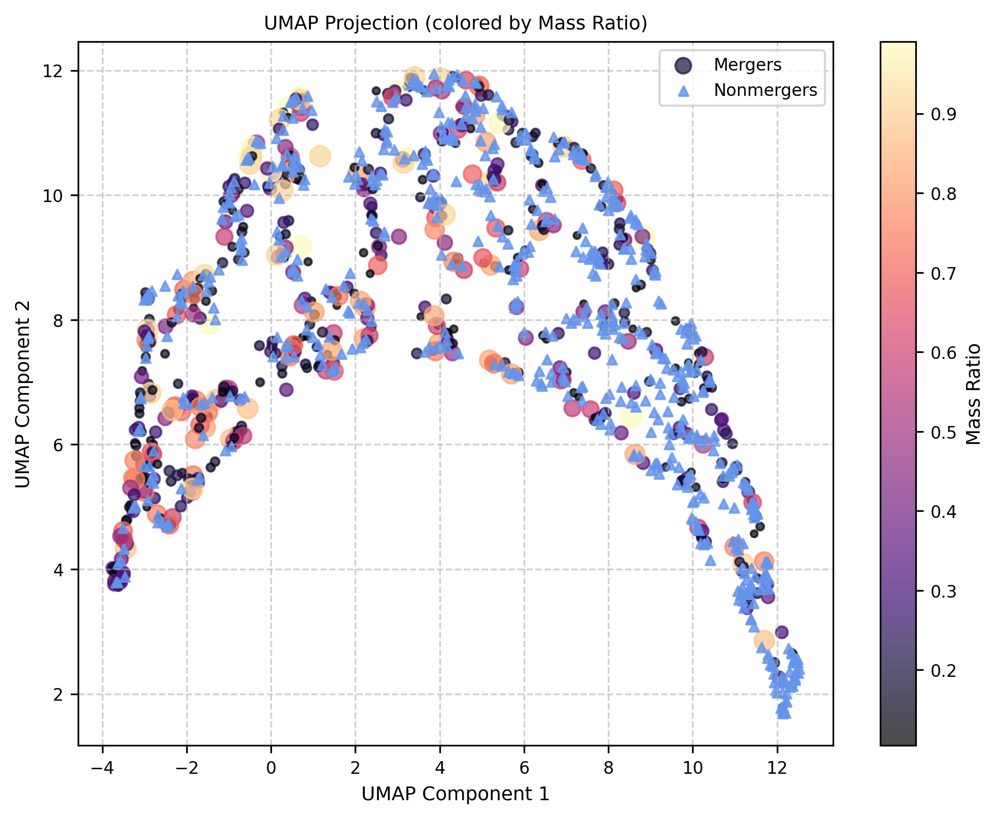

In [109]:
plt.figure(figsize=(8,6))

# Identify indices for mass ratio = 0 and mass ratio != 0
# Filter out NaNs if any were introduced
valid_indices = ~np.isnan(ratios_in_order)
zero_ratio_indices = np.where((ratios_in_order == 0) & valid_indices)[0]
non_zero_ratio_indices = np.where((ratios_in_order != 0) & valid_indices)[0]

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=ratios_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',       # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.7,
    s = np.array(ratios_in_order[non_zero_ratio_indices])*100,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label('Mass Ratio')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    color='cornflowerblue',       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    s=20,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    label='Nonmergers'
)

plt.title('UMAP Projection (colored by Mass Ratio)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.grid(True, linestyle='--', alpha=0.6)

# Add a legend for the fixed-color 'Mass Ratio = 0' points
plt.legend(loc='best') # 'best' attempts to place it where it won't overlap much

plt.show()


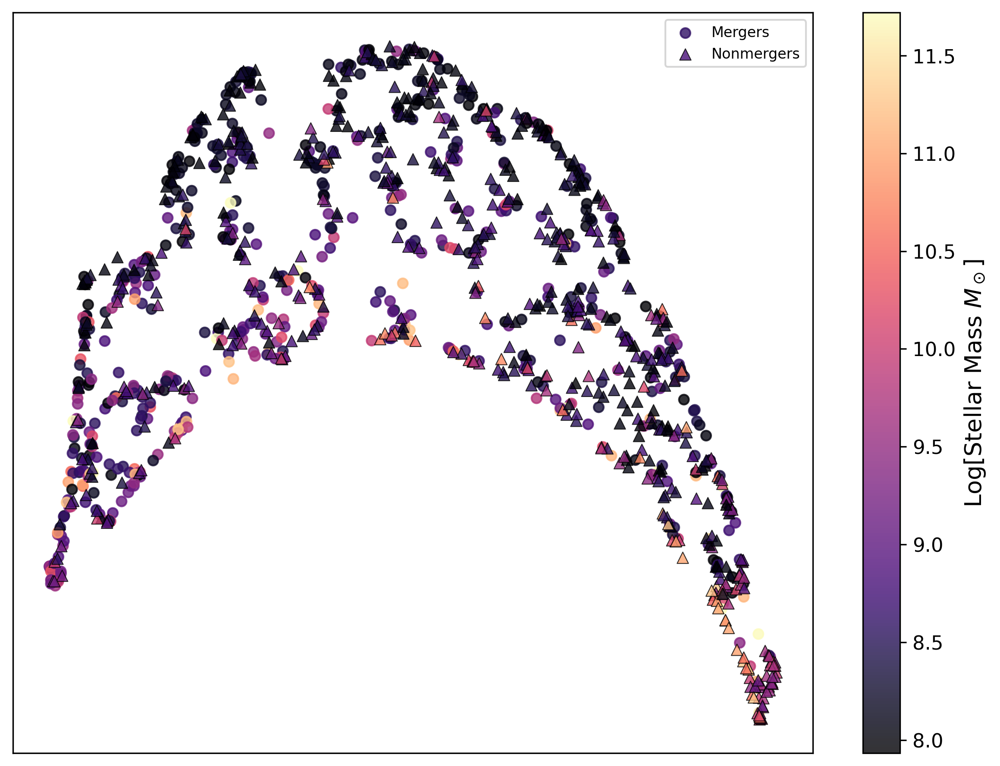

In [110]:
vmin = masses_in_order.min()
vmax = masses_in_order.max()
plt.figure(figsize=(8,6)) # Adjusted for colorbar


# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin, vmax=vmax,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label(r'Log[Stellar Mass $M_\odot$]', fontsize = 'x-large')
cbar.ax.tick_params(labelsize='large')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=masses_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin, vmax=vmax,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


plt.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

plt.legend()
plt.tight_layout()
plt.savefig('umap_stellarmass.png', dpi = 300)
plt.show()

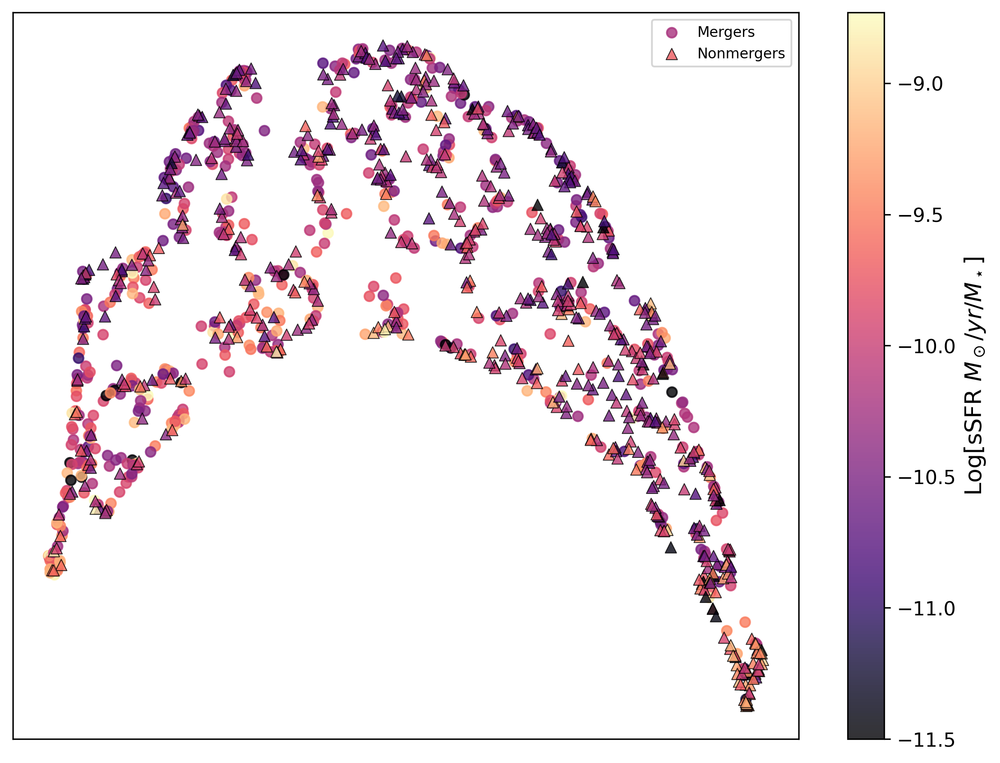

In [111]:
ssfrs_in_order = np.array(np.array(sfrs_in_order)/((np.array(masses_in_order)**(10))))
ssfrs_in_order = np.log10(ssfrs_in_order)
vmin = ssfrs_in_order.min()
vmax = ssfrs_in_order.max()
#print(ssfrs_in_order)
plt.figure(figsize=(8,6)) # Adjusted for colorbar

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=-11.5, vmax=vmax,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label(r'Log[sSFR $M_\odot/yr/M_\star$]', fontsize = 'x-large')
cbar.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=-11.5, vmax=vmax,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)

plt.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

plt.legend()
plt.tight_layout()
plt.savefig('umap_ssfr.png', dpi = 300)

plt.show()

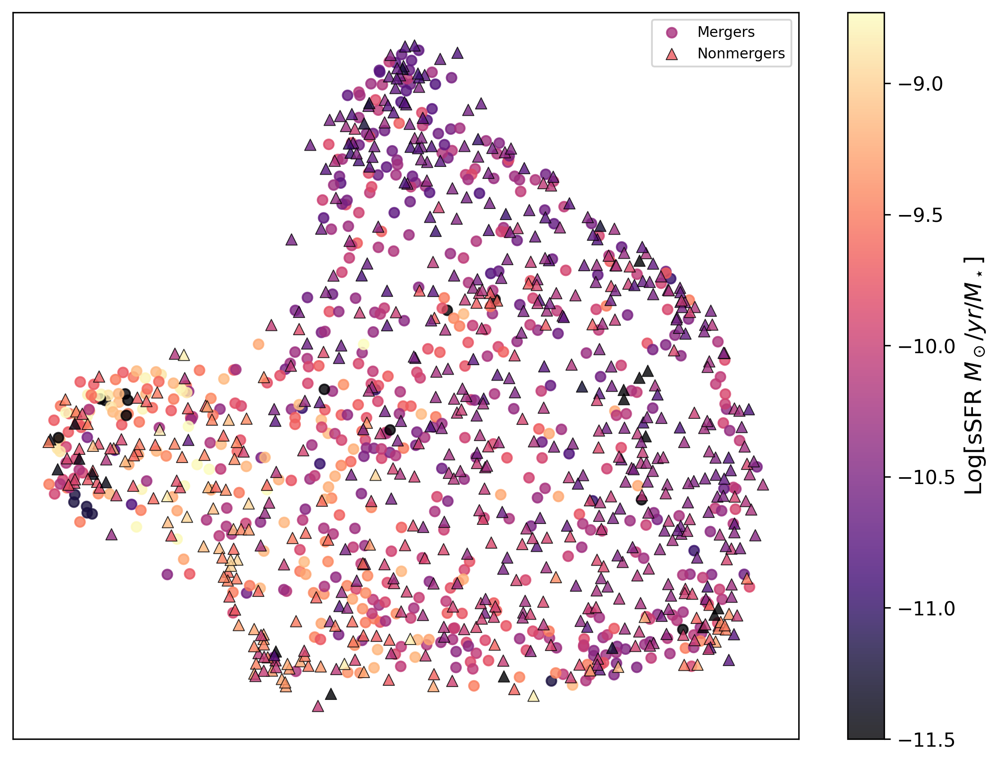

In [112]:
ssfrs_in_order = np.array(np.array(sfrs_in_order)/((np.array(masses_in_order)**(10))))
ssfrs_in_order = np.log10(ssfrs_in_order)
vmin = ssfrs_in_order.min()
vmax = ssfrs_in_order.max()
#print(ssfrs_in_order)
plt.figure(figsize=(8,6)) # Adjusted for colorbar

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = plt.scatter(
    umap_embedding_enc[non_zero_ratio_indices, 0],
    umap_embedding_enc[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=-11.5, vmax=vmax,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = plt.colorbar(scatter_non_zero)
cbar.set_label(r'Log[sSFR $M_\odot/yr/M_\star$]', fontsize = 'x-large')
cbar.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = plt.scatter(
    umap_embedding_enc[zero_ratio_indices, 0],
    umap_embedding_enc[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=-11.5, vmax=vmax,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


plt.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 
# # Add a colorbar to show the mass scale
# cbar = plt.colorbar(scatter)
# cbar.set_label('Stellar Mass') # Update label with units
plt.legend()
plt.tight_layout()
plt.savefig('umap_ssfr.png', dpi = 300)

plt.show()

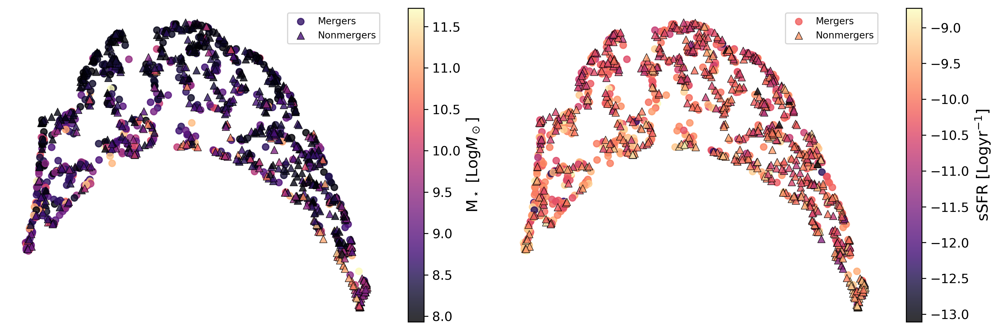

In [113]:
vmin_mass = masses_in_order.min()
vmax_mass = masses_in_order.max()
vmin_ssfr = ssfrs_in_order.min()
vmax_ssfr = ssfrs_in_order.max()
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (12, 4))

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = ax1.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = fig.colorbar(scatter_non_zero, ax=ax1)
cbar.set_label(r'M$_\star$ [Log$M_\odot$]', fontsize='x-large')
cbar.ax.tick_params(labelsize='large')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax1.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=masses_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


ax1.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

ax1.legend()
ax1.axis('off')

scatter_non_zero = ax2.scatter(
    umap_embedding[non_zero_ratio_indices, 0],
    umap_embedding[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin_ssfr, vmax=vmax_ssfr,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar2 = fig.colorbar(scatter_non_zero, ax=ax2)
cbar2.set_label(r'sSFR [Logyr$^{-1}$]', fontsize='x-large')
cbar2.ax.tick_params(labelsize='large')
# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax2.scatter(
    umap_embedding[zero_ratio_indices, 0],
    umap_embedding[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_ssfr, vmax=vmax_ssfr,  # Sync color scale
    s=40,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


ax2.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

ax2.legend()
ax2.axis('off')

plt.tight_layout()
plt.axis('off')
plt.savefig('UMAP_mass_ssfr_panel.png', dpi=300)
plt.show()

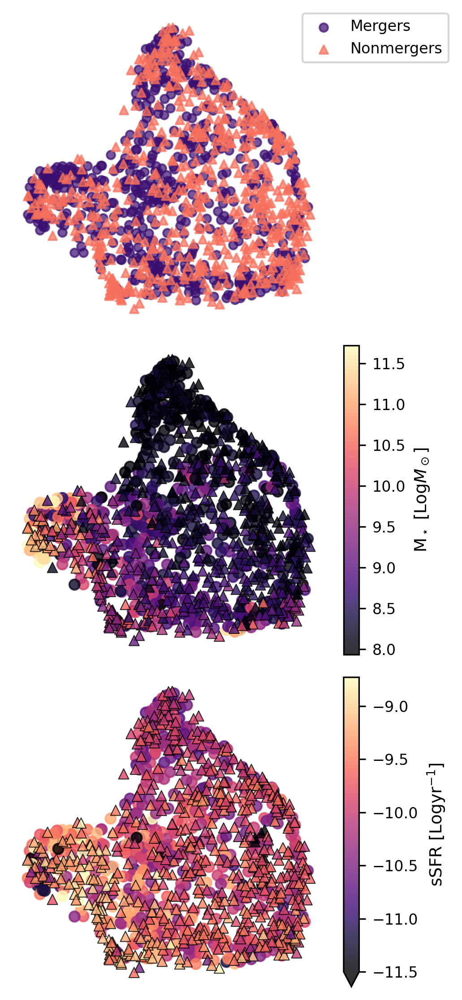

In [114]:
vmin_mass = masses_in_order.min()
vmax_mass = masses_in_order.max()
vmin_ssfr = ssfrs_in_order.min()
vmax_ssfr = ssfrs_in_order.max()
fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize = (3.5, 7.5), sharex=True, sharey=True)

scatter_true_mergers = ax1.scatter(
    umap_embedding_enc[merger_mask, 0],
    umap_embedding_enc[merger_mask, 1],
    color=mergers_color, alpha=0.7, s=20, marker='o', label='Mergers'
)
scatter_true_nonmergers = ax1.scatter(
    umap_embedding_enc[nonmerger_mask, 0],
    umap_embedding_enc[nonmerger_mask, 1],
    color=nonmergers_color, alpha=0.7, s=20, marker='^', label='Nonmergers'
)
cbar = plt.colorbar(scatter_true_mergers, ax=ax1)
cbar.ax.set_visible(False)
ax1.legend(loc='upper right', bbox_to_anchor=(1.4, 1), borderaxespad=0)
ax1.axis('off')

# 1. Plot galaxies with non-zero mass ratio (continuous colormap)
scatter_non_zero = ax2.scatter(
    umap_embedding_enc[non_zero_ratio_indices, 0],
    umap_embedding_enc[non_zero_ratio_indices, 1],
    c=masses_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar = fig.colorbar(scatter_non_zero, ax=ax2)
cbar.set_label(r'M$_\star$ [Log$M_\odot$]') # fontsize='x-large'
# cbar.ax.tick_params(labelsize='large')

# 2. Plot galaxies with mass ratio = 0 (distinct fixed color)
scatter_zero = ax2.scatter(
    umap_embedding_enc[zero_ratio_indices, 0],
    umap_embedding_enc[zero_ratio_indices, 1],
    c=masses_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_mass, vmax=vmax_mass,  # Sync color scale
    s=30,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


ax2.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

# ax2.legend()
ax2.axis('off')

scatter_non_zero = ax3.scatter(
    umap_embedding_enc[non_zero_ratio_indices, 0],
    umap_embedding_enc[non_zero_ratio_indices, 1],
    c=ssfrs_in_order[non_zero_ratio_indices], # Color by mass ratio
    cmap='magma',#'magma',  
    vmin=-11.5, vmax=vmax_ssfr,  # Sync color scale,
    # Choose a colormap for continuous data (e.g., 'viridis', 'plasma', 'magma')
    alpha=0.8,
    s = 30,
    label='Mergers'
)

# Add a colorbar for the continuous mass ratios
cbar2 = fig.colorbar(scatter_non_zero, ax=ax3, extend='min')
cbar2.set_label(r'sSFR [Logyr$^{-1}$]')

scatter_zero = ax3.scatter(
    umap_embedding_enc[zero_ratio_indices, 0],
    umap_embedding_enc[zero_ratio_indices, 1],
    c=ssfrs_in_order[zero_ratio_indices],       # Choose a distinct color (e.g., 'red', 'blue', 'lime', 'cyan')
    alpha=0.8,
    cmap = 'magma',
    vmin=vmin_ssfr, vmax=vmax_ssfr,  # Sync color scale
    s=30,               # Make them slightly larger or use a different marker for emphasis
    marker='^',
    edgecolors='black',
    linewidths=0.5,
    label='Nonmergers'
)


ax3.tick_params(axis='both',          # Apply to both x and y axes
                which='both',         # Apply to both major and minor ticks
                bottom=False,         # Turn off ticks along the bottom edge
                top=False,            # Turn off ticks along the top edge
                left=False,           # Turn off ticks along the left edge
                right=False,          # Turn off ticks along the right edge
                labelbottom=False,    # Turn off labels along the bottom edge
                labelleft=False) 

ax3.axis('off')

ax3.set_xlabel('UMAP 1')
ax2.set_ylabel('UMAP 2')


plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.axis('off')
plt.savefig('UMAP_mass_ssfr_panel.png', dpi=300)
plt.show()